In [1]:
#importing required Libraries 

from IPython.display import display
import math
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score, silhouette_score
import matplotlib.pyplot as plt
from scipy.special import expit
from sklearn.cluster import KMeans

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

# DATA CLEANING AND PREPROCESSING 

First thing was to bring the ORDER_DATE column to the very first column in the csv file in order to make it and index and subsequently sort the index chronologically for further analysis.

In [2]:
# Read data from the 'Exercise_data.csv' file into a DataFrame 'sales_df'
sales_df = pd.read_csv('./Exercise_data.csv', index_col=0, dayfirst=True)

sales_df.head(10)

,CUSTOMER_ID,ROW,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE
ORDER_DATE,,,,,,,,,,,,,,,,,,
30/11/2019,3731,176108,131,10,25.40,1,Region_8,6.637202,21.08,17,0.72594,7,7,147.56,-0.216880,NaN,0.939599,15
23/07/2019,576,54799,131,10,25.40,0,Region_11,10.545221,20.83,18,1.75378,5,3,62.49,-0.395627,NaN,0.801202,15
15/10/2022,2180,130623,131,10,7.76,1,Region_0,8.221116,6.60,15,0.22689,6,10,66.00,-1.822476,NaN,3.943928,15
25/07/2019,487,2851,131,10,25.40,0,Region_4,10.599284,24.89,2,0.00000,3,4,99.56,1.564532,NaN,13.326039,15
25/05/2022,554,12598,131,10,7.76,0,Region_0,10.574030,7.53,3,0.00000,2,7,52.71,-0.191843,NaN,2.188268,15
24/12/2019,1017,174885,131,10,25.40,0,Region_11,6.853093,23.37,8,0.07287,5,7,163.59,-0.380842,NaN,1.346072,15
27/12/2022,602,161251,131,10,7.76,0,Region_4,5.883634,7.60,2,0.14967,1,6,45.60,-0.367142,NaN,9.130392,15
07/07/2019,1885,166203,131,10,25.40,0,Region_11,8.162708,22.86,10,0.11812,2,7,160.02,-0.101590,NaN,2.559180,15
21/11/2021,473,20791,131,10,30.48,1,Region_7,10.555622,27.13,11,1.19485,1,8,217.04,0.197727,NaN,1.768061,15


In [3]:
# Display information about the 'sales_df' DataFrame
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 200000 entries, 30/11/2019 to 28-Mar-21
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   CUSTOMER_ID       200000 non-null  int64  
 1   ROW               200000 non-null  int64  
 2   PRODUCT_ID        200000 non-null  int64  
 3   PRODUCT_CATEGORY  200000 non-null  int64  
 4   LIST_PRICE        200000 non-null  float64
 5   SEASONALITY       200000 non-null  int64  
 6   CUSTOMER_REGION   200000 non-null  object 
 7   LOYALTY_SCORE     197360 non-null  float64
 8   SOLD_PRICES       200000 non-null  float64
 9   DISCOUNT_OFFERED  200000 non-null  int64  
 10  PRODUCT_RATING    200000 non-null  float64
 11  SHIPPING_TIME     200000 non-null  int64  
 12  UNITS_ORDERED     200000 non-null  int64  
 13  SALES             200000 non-null  float64
 14  FEATURE_1         200000 non-null  float64
 15  FEATURE_2         194000 non-null  float64
 16  FEATURE_3    

**Code block for different functions to be applied in the course of the Analysis**

In [4]:
# Code block for different functions to be applied in the course of the Analysis

# Function to add date and time features to a DataFrame
def date_time_features(df):
    """
    Adds date features to a DataFrame based on its index.
    Args:
        df (DataFrame): The input DataFrame with a datetime index.
    Returns:
        DataFrame: The DataFrame with added date features.
    """
    df['MONTH'] = df.index.month
    df['QUARTER'] = df.index.quarter
    df['YEAR'] = df.index.year
    return df

# Create new features from the ones provided to evaluate the unit profit or loss, thereafter calculate the sales unit profit or loss
def sales_stats_feature_engineering(df):
    """
    Performs feature engineering related to sales data in a DataFrame.
    Args:
        df (DataFrame): The input DataFrame containing sales data.
    Returns:
        DataFrame: The DataFrame with additional sales-related features.
    """
    df['NON_DISCOUNT_SALES'] = df['LIST_PRICE'] * df['UNITS_ORDERED']
    df['DISCOUNT_AMOUNT'] = df['SOLD_PRICES'] - df['LIST_PRICE']
    df['DISCOUNT_PROFIT_LOSS'] = df['DISCOUNT_AMOUNT'] * df['UNITS_ORDERED']
    return df
    
# Function to create a distribution plot for DataFrame columns   
def distribution_plot(df):
    """
    Creates a distribution plot (histogram) for each column in a DataFrame.
    Args:
        df (DataFrame): The input DataFrame for which distribution plots are created.
    """
    fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30, 16))
    for i, col in enumerate(df.columns):
        axs[i//5][i%5].hist(df[col])
        axs[i//5][i%5].set_title(col, fontsize=9)

    # Show the plot
    plt.show()

# Function to format the index of a DataFrame to datet objects
def get_index_formatted(df):
    """
    Formats the index of a DataFrame to datetime objects in the desired format.
    Args:
        df (DataFrame): The input DataFrame with date-like index values.
    Returns:
        DataFrame: The DataFrame with formatted datetime index.
    """
    date_index = df.index
    datetime_objects = []
    for date in date_index:
        try:
            datetime_objects.append(datetime.strptime(date, '%d-%b-%y'))
        except ValueError:
            datetime_objects.append(datetime.strptime(date, '%d/%m/%Y'))

    # Convert datetime objects to strings in the desired format
    formatted_dates = [datetime.strftime(dt, '%d/%m/%Y') for dt in datetime_objects]
    df.index = pd.to_datetime(formatted_dates, format='%d/%m/%Y')
    return df

# Function to create grouped plots (bar, line, or pie) for multiple DataFrames
def groupbyplots_MM_QQ_YY(dfs, plot_type='bar', title='Sum of Sales', ylabel='Sales Sum'):
    """
    Creates grouped plots for multiple DataFrames based on the chosen plot type.
    
    Args:
        dfs (list of DataFrames): List of DataFrames to be plotted.
        plot_type (str): Type of plot to create ('bar', 'line', or 'pie').
        title (str): Title for the plot.
        ylabel (str): Label for the y-axis.
    """
    fig, axs = plt.subplots(nrows=len(dfs), ncols=1, figsize=(8, 6*len(dfs)))

    # Loop through the dataframes and plot them in the subplots
    for i, df in enumerate(dfs):
        ax = axs[i]
        if plot_type == 'line':
            df.plot(kind='line', ax=ax, color=['#008fd5', '#fc4f30'])
        elif plot_type == 'pie':
            df.plot(kind='pie', ax=ax)
        else:
            df.plot(kind='bar', ax=ax, color=['#008fd5', '#fc4f30'])

        # Set the plot title and axis labels
        ax.set_title(title)
        ax.set_ylabel(ylabel)

    # Adjust the layout of the subplots
    plt.tight_layout()

    # Show the plot
    plt.show()
    


In [5]:
# This gets the index formated to proper dates 'd/m/Y' and subsequently sorts it in chronological order
sales_df = get_index_formatted(sales_df)

In [8]:
# Generate summary statistics for the 'sales_df' DataFrame
sales_df.describe().T

,count,mean,std,min,25%,50%,75%,max
CUSTOMER_ID,200000.0,1645.533510,1167.602401,1.000000,537.000000,1334.000000,2664.000000,4000.000000
ROW,200000.0,100000.500000,57735.171256,1.000000,50000.750000,100000.500000,150000.250000,200000.000000
PRODUCT_ID,200000.0,100.563020,57.630688,1.000000,51.000000,101.000000,150.000000,200.000000
PRODUCT_CATEGORY,200000.0,5.626650,3.089603,1.000000,3.000000,5.000000,8.000000,11.000000
LIST_PRICE,200000.0,78.918075,56.902657,0.750000,35.910000,67.080000,107.990000,339.370000
SEASONALITY,200000.0,0.581320,0.493344,0.000000,0.000000,1.000000,1.000000,1.000000
LOYALTY_SCORE,197360.0,8.115791,1.975688,0.000000,6.656451,7.506970,10.521241,10.620975
SOLD_PRICES,200000.0,71.080434,51.603436,0.600000,32.230000,60.090000,96.190000,339.370000
DISCOUNT_OFFERED,200000.0,9.927880,6.095888,0.000000,5.000000,10.000000,15.000000,20.000000
PRODUCT_RATING,200000.0,0.982152,1.021793,0.000000,0.097528,0.688520,1.564592,4.999430


In [156]:
# Removing the 'ROW' column it appears to be serial numbers and doesn't provide meaningful information
sales_df.drop(columns=["ROW"], inplace=True)

In [157]:
# Display the first 50 rows of the 'sales_df' DataFrame
sales_df.head(50)

,CUSTOMER_ID,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE
2019-11-30,3731,131,10,25.40,1,Region_8,6.637202,21.08,17,0.72594,7,7,147.56,-0.216880,NaN,0.939599,15
2019-07-23,576,131,10,25.40,0,Region_11,10.545221,20.83,18,1.75378,5,3,62.49,-0.395627,NaN,0.801202,15
2022-10-15,2180,131,10,7.76,1,Region_0,8.221116,6.60,15,0.22689,6,10,66.00,-1.822476,NaN,3.943928,15
2019-07-25,487,131,10,25.40,0,Region_4,10.599284,24.89,2,0.00000,3,4,99.56,1.564532,NaN,13.326039,15
2022-05-25,554,131,10,7.76,0,Region_0,10.574030,7.53,3,0.00000,2,7,52.71,-0.191843,NaN,2.188268,15
2019-12-24,1017,131,10,25.40,0,Region_11,6.853093,23.37,8,0.07287,5,7,163.59,-0.380842,NaN,1.346072,15
2022-12-27,602,131,10,7.76,0,Region_4,5.883634,7.60,2,0.14967,1,6,45.60,-0.367142,NaN,9.130392,15
2019-07-07,1885,131,10,25.40,0,Region_11,8.162708,22.86,10,0.11812,2,7,160.02,-0.101590,NaN,2.559180,15
2021-11-21,473,131,10,30.48,1,Region_7,10.555622,27.13,11,1.19485,1,8,217.04,0.197727,NaN,1.768061,15
2019-11-10,1103,131,10,25.40,1,Region_3,6.270776,20.83,18,0.87202,2,6,124.98,-1.447644,NaN,4.620103,15


In [158]:
# Add date features to the 'sales_df' DataFrame
sales_df = date_time_features(sales_df)

In [159]:
# Display the first 50 rows of the 'sales_df' DataFrame
sales_df.head(50)

,CUSTOMER_ID,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE,MONTH,QUARTER,YEAR
2019-11-30,3731,131,10,25.40,1,Region_8,6.637202,21.08,17,0.72594,7,7,147.56,-0.216880,NaN,0.939599,15,11,4,2019
2019-07-23,576,131,10,25.40,0,Region_11,10.545221,20.83,18,1.75378,5,3,62.49,-0.395627,NaN,0.801202,15,7,3,2019
2022-10-15,2180,131,10,7.76,1,Region_0,8.221116,6.60,15,0.22689,6,10,66.00,-1.822476,NaN,3.943928,15,10,4,2022
2019-07-25,487,131,10,25.40,0,Region_4,10.599284,24.89,2,0.00000,3,4,99.56,1.564532,NaN,13.326039,15,7,3,2019
2022-05-25,554,131,10,7.76,0,Region_0,10.574030,7.53,3,0.00000,2,7,52.71,-0.191843,NaN,2.188268,15,5,2,2022
2019-12-24,1017,131,10,25.40,0,Region_11,6.853093,23.37,8,0.07287,5,7,163.59,-0.380842,NaN,1.346072,15,12,4,2019
2022-12-27,602,131,10,7.76,0,Region_4,5.883634,7.60,2,0.14967,1,6,45.60,-0.367142,NaN,9.130392,15,12,4,2022
2019-07-07,1885,131,10,25.40,0,Region_11,8.162708,22.86,10,0.11812,2,7,160.02,-0.101590,NaN,2.559180,15,7,3,2019
2021-11-21,473,131,10,30.48,1,Region_7,10.555622,27.13,11,1.19485,1,8,217.04,0.197727,NaN,1.768061,15,11,4,2021
2019-11-10,1103,131,10,25.40,1,Region_3,6.270776,20.83,18,0.87202,2,6,124.98,-1.447644,NaN,4.620103,15,11,4,2019


In [160]:
# Sort the 'sales_df' DataFrame by its index
sales_df = sales_df.sort_index()

In [161]:
sales_df.head(10)

,CUSTOMER_ID,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE,MONTH,QUARTER,YEAR
2019-01-01,3998,154,4,66.23,1,Region_7,6.564614,56.30,15,1.68642,2,6,337.80,-0.656389,0.194415,1.835386,13,1,1,2019
2019-01-01,2684,26,9,41.69,1,Region_4,6.989686,37.10,11,0.14493,4,12,445.20,-0.478283,3.357257,2.176307,14,1,1,2019
2019-01-01,413,85,10,48.53,1,Region_4,10.586509,39.31,19,1.52019,9,13,511.03,-2.027565,1.720003,4.162537,5,1,1,2019
2019-01-01,600,141,2,82.47,1,Region_9,10.616324,72.57,12,0.08798,3,13,943.41,-0.132933,5.009023,5.550882,12,1,1,2019
2019-01-01,2650,147,8,66.98,1,Region_10,5.216782,59.61,11,0.44056,9,11,655.71,1.854769,3.339053,2.207430,6,1,1,2019
2019-01-01,592,72,9,90.67,1,Region_4,10.567827,79.79,12,0.22387,3,9,718.11,-0.959161,0.477055,4.258450,6,1,1,2019
2019-01-01,739,15,4,35.07,1,Region_3,7.124956,33.67,4,3.99671,7,6,202.02,-0.874811,1.809758,2.972772,9,1,1,2019
2019-01-01,3062,98,6,88.99,1,Region_4,6.301910,83.65,6,0.35684,1,6,501.90,-1.611404,2.485915,4.828196,11,1,1,2019
2019-01-01,1664,162,6,71.63,1,Region_4,6.910110,70.91,1,1.92290,5,6,425.46,-0.901128,4.682122,2.158968,5,1,1,2019
2019-01-01,419,164,9,44.71,1,Region_5,10.556024,41.13,8,3.99383,2,10,411.30,-1.831260,0.451772,3.697433,4,1,1,2019


In [162]:
# Get the dimensions of the 'sales_df' DataFrame
sales_df.shape

(200000, 20)

In [163]:
# Count missing (null) values in each column of the 'sales_df' DataFrame
sales_df.isnull().sum()

CUSTOMER_ID            0
PRODUCT_ID             0
PRODUCT_CATEGORY       0
LIST_PRICE             0
SEASONALITY            0
CUSTOMER_REGION        0
LOYALTY_SCORE       2640
SOLD_PRICES            0
DISCOUNT_OFFERED       0
PRODUCT_RATING         0
SHIPPING_TIME          0
UNITS_ORDERED          0
SALES                  0
FEATURE_1              0
FEATURE_2           6000
FEATURE_3              0
PRODUCT_AGE            0
MONTH                  0
QUARTER                0
YEAR                   0
dtype: int64

In [164]:
# Calculate the percentage of missing (null) values in each column of the 'sales_df' DataFrame
(sales_df.isnull().sum()/ len(sales_df)) * 100

CUSTOMER_ID         0.00
PRODUCT_ID          0.00
PRODUCT_CATEGORY    0.00
LIST_PRICE          0.00
SEASONALITY         0.00
CUSTOMER_REGION     0.00
LOYALTY_SCORE       1.32
SOLD_PRICES         0.00
DISCOUNT_OFFERED    0.00
PRODUCT_RATING      0.00
SHIPPING_TIME       0.00
UNITS_ORDERED       0.00
SALES               0.00
FEATURE_1           0.00
FEATURE_2           3.00
FEATURE_3           0.00
PRODUCT_AGE         0.00
MONTH               0.00
QUARTER             0.00
YEAR                0.00
dtype: float64

In [165]:
# Display the last 400 rows of the 'sales_df' DataFrame
sales_df.tail(400)

,CUSTOMER_ID,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE,MONTH,QUARTER,YEAR
2022-12-29,1306,147,8,164.43,0,Region_1,3.345312,164.43,0,0.00000,2,5,822.15,-0.576715,2.233875,0.704997,6,12,4,2022
2022-12-29,438,97,1,106.71,0,Region_10,10.528377,102.44,4,0.46381,10,6,614.64,-1.864638,0.200840,0.202377,8,12,4,2022
2022-12-29,585,179,8,34.05,0,Region_5,10.620975,30.65,10,2.35230,6,6,183.90,-0.615303,0.403225,2.435872,12,12,4,2022
2022-12-29,674,123,11,76.06,0,Region_10,4.774373,73.02,4,0.00000,5,3,219.06,0.009909,2.852667,1.321246,13,12,4,2022
2022-12-29,510,9,9,51.66,0,Region_5,10.557355,50.11,3,0.74571,0,9,450.99,-0.119643,0.565682,4.248751,11,12,4,2022
2022-12-29,1201,171,4,63.80,0,Region_5,5.881881,51.68,19,1.90475,4,4,206.72,0.735877,0.599161,10.917571,15,12,4,2022
2022-12-29,494,172,9,2.53,0,Region_2,10.562853,2.10,17,2.80191,11,6,12.60,2.082933,NaN,3.831155,4,12,4,2022
2022-12-29,3314,77,1,109.49,0,Region_9,6.376748,108.40,1,1.73071,12,10,1084.00,0.207618,0.769004,9.800480,4,12,4,2022
2022-12-29,3726,9,9,51.66,0,Region_8,7.608128,47.01,9,1.00163,2,10,470.10,-1.116419,1.697662,2.260336,11,12,4,2022
2022-12-29,500,163,9,59.77,0,Region_9,10.514567,54.99,8,0.22308,3,5,274.95,-0.663942,0.212834,3.116089,4,12,4,2022


From the above cell 14, the missing data is simply 3% of the entire dataset in the case of FEATURE_2 and 1.32% for LOYALTY_SCORE 

In [166]:
# Remove rows with missing (null) values from the 'sales_df' DataFrame
sales_df.dropna(inplace=True)

In [167]:
# Perform feature engineering on the 'sales_df' DataFrame
sales_df = sales_stats_feature_engineering(sales_df)

In [168]:
sales_df.head(200)

,CUSTOMER_ID,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE,MONTH,QUARTER,YEAR,NON_DISCOUNT_SALES,DISCOUNT_AMOUNT,DISCOUNT_PROFIT_LOSS
2019-01-01,3998,154,4,66.23,1,Region_7,6.564614,56.30,15,1.68642,2,6,337.80,-0.656389,0.194415,1.835386,13,1,1,2019,397.38,-9.93,-59.58
2019-01-01,2684,26,9,41.69,1,Region_4,6.989686,37.10,11,0.14493,4,12,445.20,-0.478283,3.357257,2.176307,14,1,1,2019,500.28,-4.59,-55.08
2019-01-01,413,85,10,48.53,1,Region_4,10.586509,39.31,19,1.52019,9,13,511.03,-2.027565,1.720003,4.162537,5,1,1,2019,630.89,-9.22,-119.86
2019-01-01,600,141,2,82.47,1,Region_9,10.616324,72.57,12,0.08798,3,13,943.41,-0.132933,5.009023,5.550882,12,1,1,2019,1072.11,-9.90,-128.70
2019-01-01,2650,147,8,66.98,1,Region_10,5.216782,59.61,11,0.44056,9,11,655.71,1.854769,3.339053,2.207430,6,1,1,2019,736.78,-7.37,-81.07
2019-01-01,592,72,9,90.67,1,Region_4,10.567827,79.79,12,0.22387,3,9,718.11,-0.959161,0.477055,4.258450,6,1,1,2019,816.03,-10.88,-97.92
2019-01-01,739,15,4,35.07,1,Region_3,7.124956,33.67,4,3.99671,7,6,202.02,-0.874811,1.809758,2.972772,9,1,1,2019,210.42,-1.40,-8.40
2019-01-01,3062,98,6,88.99,1,Region_4,6.301910,83.65,6,0.35684,1,6,501.90,-1.611404,2.485915,4.828196,11,1,1,2019,533.94,-5.34,-32.04
2019-01-01,1664,162,6,71.63,1,Region_4,6.910110,70.91,1,1.92290,5,6,425.46,-0.901128,4.682122,2.158968,5,1,1,2019,429.78,-0.72,-4.32
2019-01-01,419,164,9,44.71,1,Region_5,10.556024,41.13,8,3.99383,2,10,411.30,-1.831260,0.451772,3.697433,4,1,1,2019,447.10,-3.58,-35.80


In [169]:
# Count missing (null) values in each column of the 'sales_df' DataFrame after droping NaN
sales_df.isnull().sum()

CUSTOMER_ID             0
PRODUCT_ID              0
PRODUCT_CATEGORY        0
LIST_PRICE              0
SEASONALITY             0
CUSTOMER_REGION         0
LOYALTY_SCORE           0
SOLD_PRICES             0
DISCOUNT_OFFERED        0
PRODUCT_RATING          0
SHIPPING_TIME           0
UNITS_ORDERED           0
SALES                   0
FEATURE_1               0
FEATURE_2               0
FEATURE_3               0
PRODUCT_AGE             0
MONTH                   0
QUARTER                 0
YEAR                    0
NON_DISCOUNT_SALES      0
DISCOUNT_AMOUNT         0
DISCOUNT_PROFIT_LOSS    0
dtype: int64

# Exploratory Data Analysis

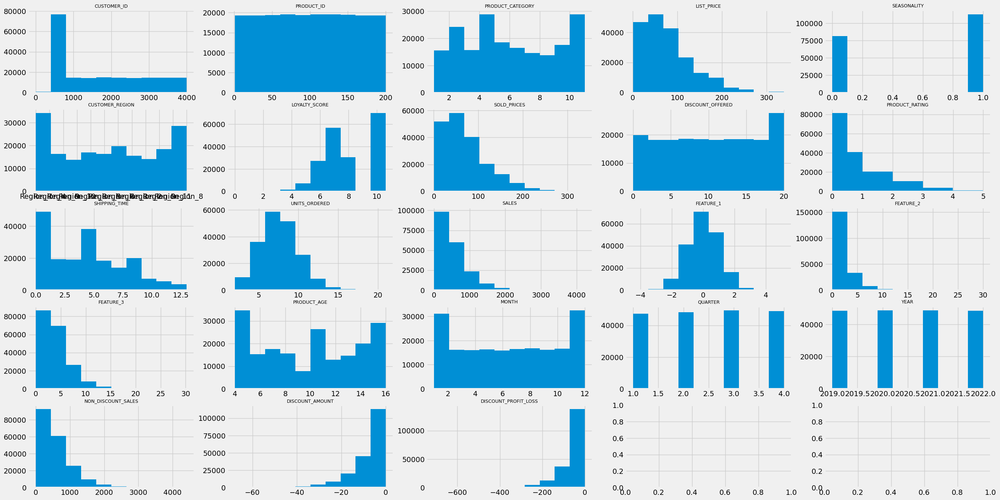

In [170]:
# Create distribution plots for columns in the 'sales_df' DataFrame
distribution_plot(sales_df)

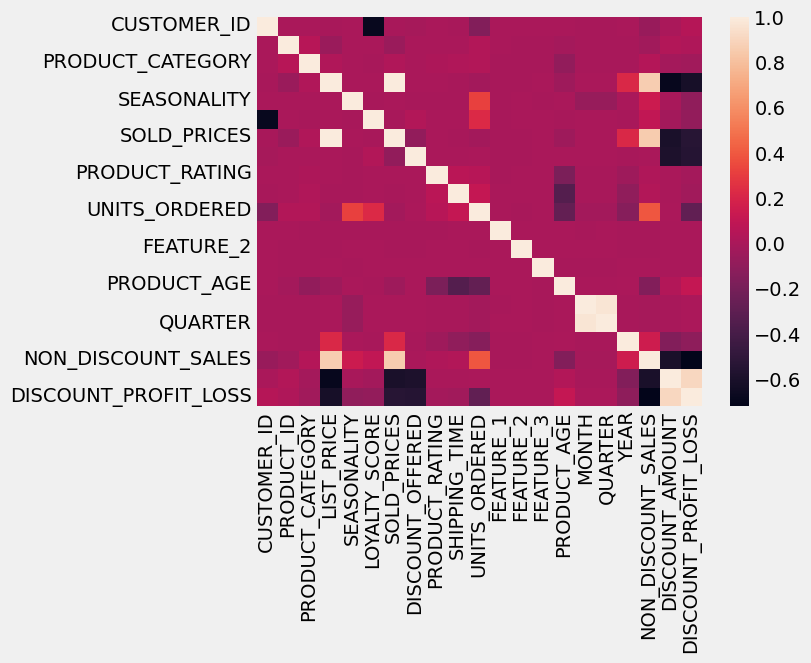

In [171]:
# A correlation of numerical features in sales_df and dropping the target.
correlation = sales_df.select_dtypes('number').drop(columns='SALES').corr()

# Plot heatmap of 'correlation'
sns.heatmap(correlation)
plt.show()  #show the plot


In [172]:
# Perform various aggregations on the 'sales_df' DataFrame, grouping data by 'CUSTOMER_REGION' to analyze regional statistics.
grouped_loyalty = sales_df.groupby(['CUSTOMER_REGION'])['LOYALTY_SCORE'].mean()
grouped_regions = sales_df.groupby(['CUSTOMER_REGION'])['CUSTOMER_ID'].count()
grouped_shipping = sales_df.groupby(['CUSTOMER_REGION'])['SHIPPING_TIME'].mean()
grouped_units_ordered = sales_df.groupby(['CUSTOMER_REGION'])['UNITS_ORDERED'].sum()
grouped_product_ordered = sales_df.groupby(['PRODUCT_CATEGORY'])['UNITS_ORDERED'].sum()
grouped_product_shipping = sales_df.groupby(['PRODUCT_CATEGORY'])['SHIPPING_TIME'].mean()

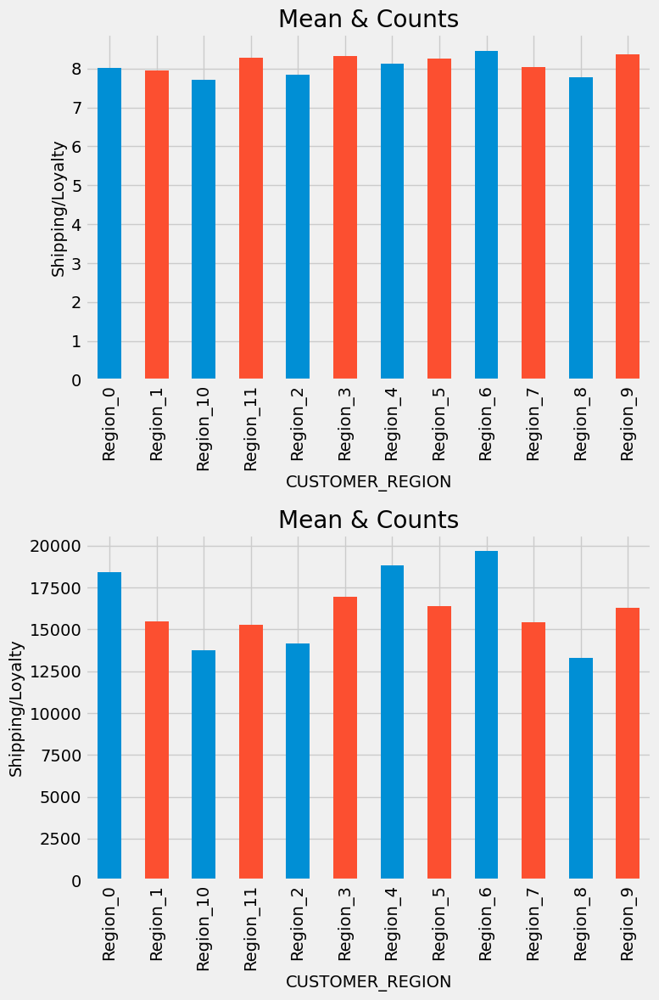

In [173]:
# Create grouped plots for multiple statistics by 'CUSTOMER_REGION'
groupbyplots_MM_QQ_YY(
    [grouped_loyalty, grouped_regions],
    plot_type='bar', title='Mean & Counts', ylabel='Shipping/Loyalty'
)

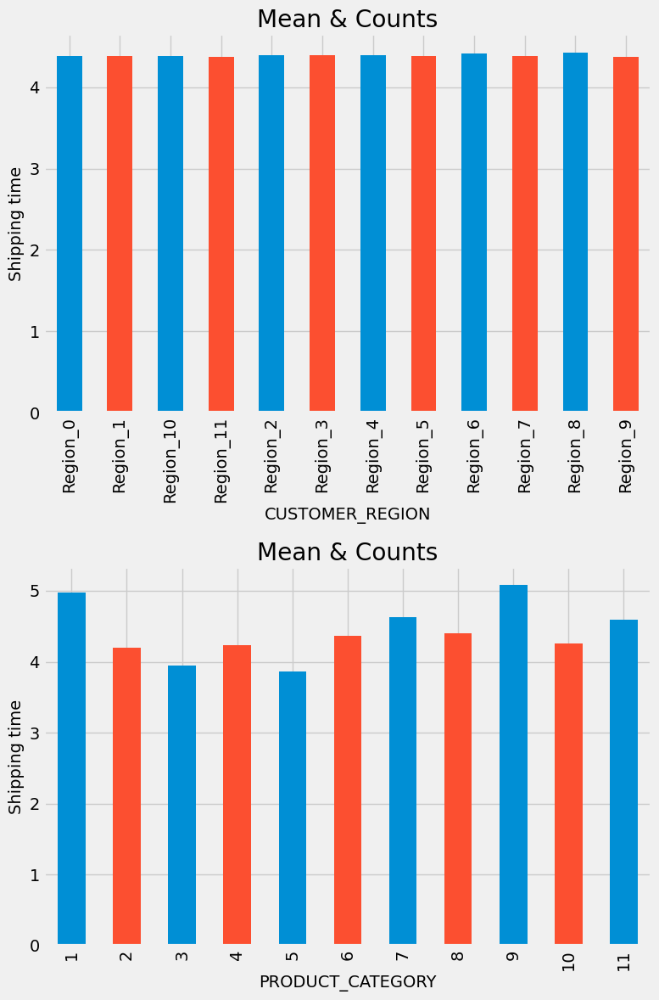

In [174]:
groupbyplots_MM_QQ_YY(
    [grouped_shipping, grouped_product_shipping],
    plot_type='bar', title='Mean & Counts', ylabel='Shipping time'
)

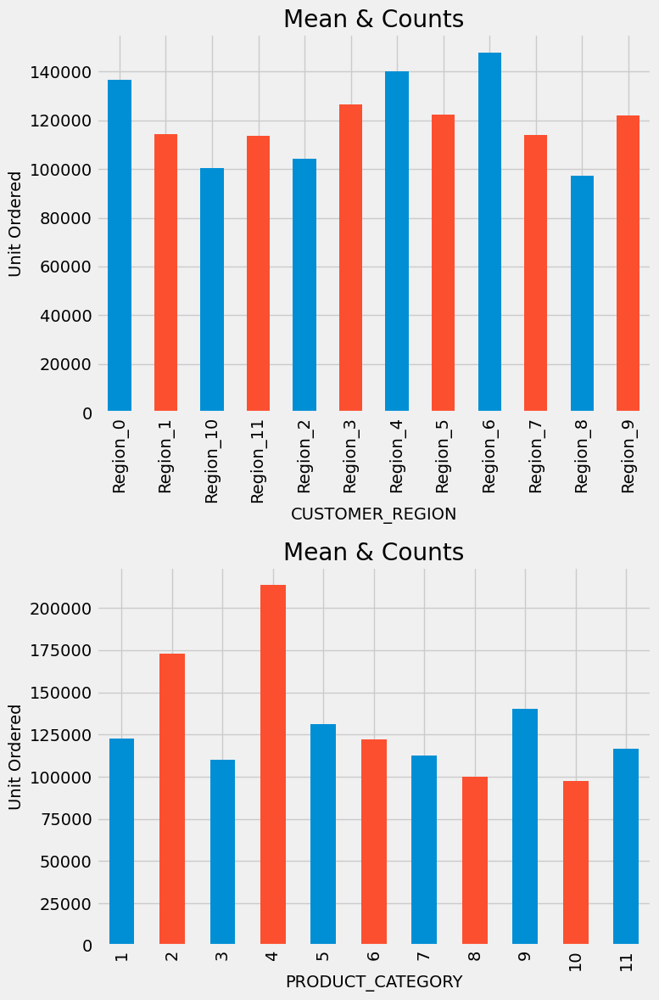

In [175]:
# Create grouped plots for multiple statistics by 'CUSTOMER_REGION'
groupbyplots_MM_QQ_YY(
    [grouped_units_ordered, grouped_product_ordered], 
    plot_type='bar', title='Mean & Counts', ylabel='Unit Ordered'
)

In [176]:
# group the dataframe by region and product columns and sum the sales with the corresponding discounts applied
grouped_MM = sales_df.groupby(['MONTH'])['SALES'].sum()
grouped_QQ = sales_df.groupby(['QUARTER'])['SALES'].sum()
grouped_YY = sales_df.groupby(['YEAR'])['SALES'].sum()
grouped_RG = sales_df.groupby(['CUSTOMER_REGION'])['SALES'].sum()

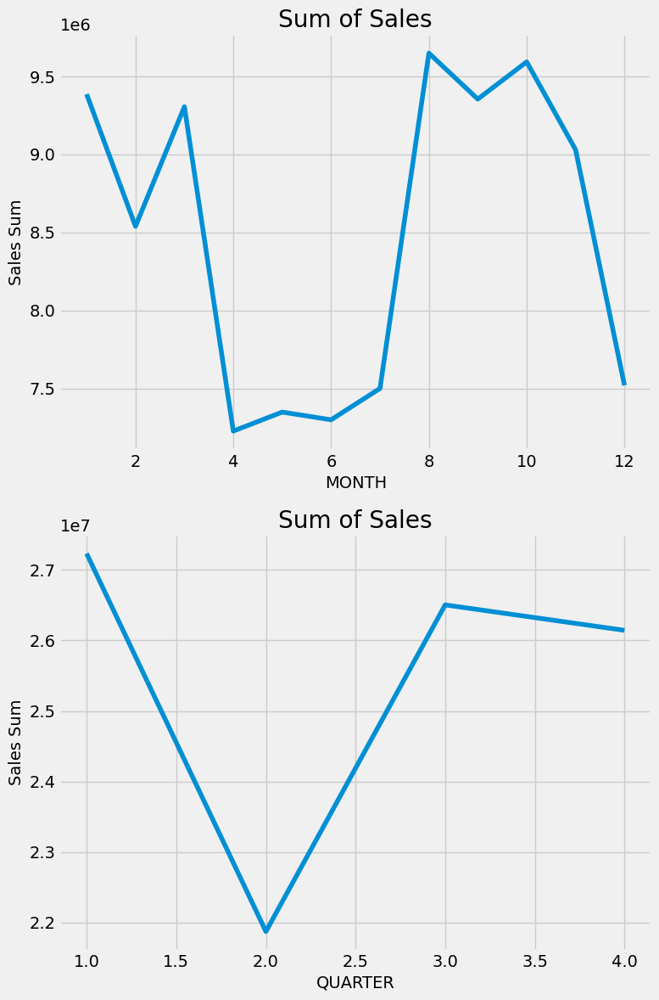

In [177]:
# The charts below shows the total sum generated from the sales over different periods from 2019 to 2022. It also captures the months, quarters and year with the highest grossing sales 

groupbyplots_MM_QQ_YY(
    [grouped_MM, grouped_QQ,], 
    plot_type='line', title='Sum of Sales', ylabel='Sales Sum'
)

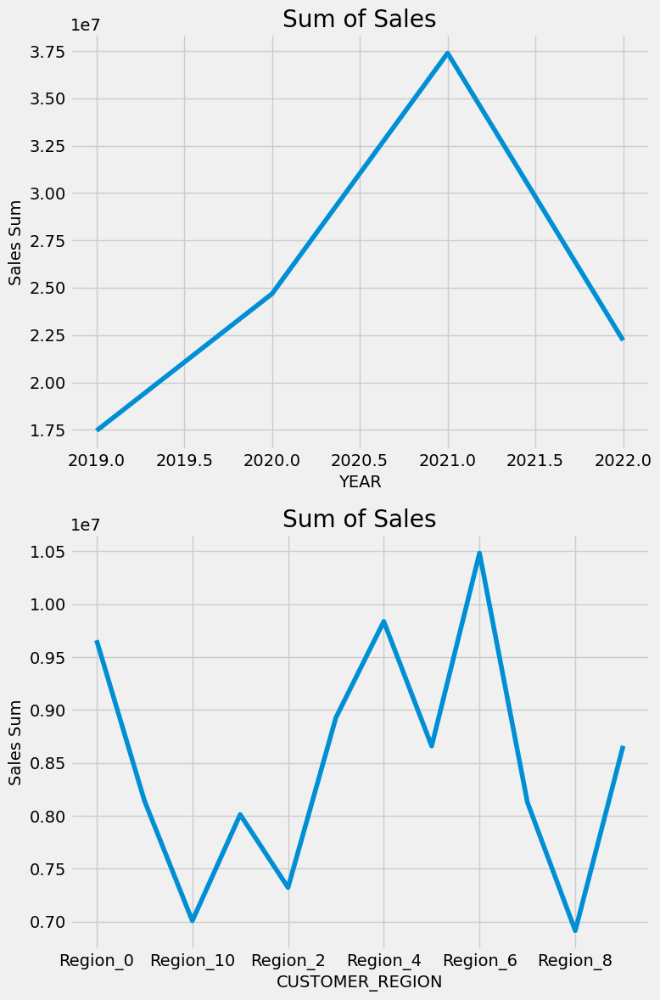

In [178]:
# The charts below shows the total sum generated from the sales over different periods from 2019 to 2022. It also captures the months, quarters and year with the highest grossing sales 
groupbyplots_MM_QQ_YY(
    [grouped_YY, grouped_RG], 
    plot_type='line', title='Sum of Sales', ylabel='Sales Sum'
)

In [179]:
# group the dataframe by date periods columns and sum the variance of the undiscounted sales to the discounted one. The company appears to put discounts on all of her products
grouped_discount_MM = sales_df.groupby(['MONTH'])['DISCOUNT_PROFIT_LOSS'].sum()
grouped_discount_QQ = sales_df.groupby(['QUARTER'])['DISCOUNT_PROFIT_LOSS'].sum()
grouped_discount_YY = sales_df.groupby(['YEAR'])['DISCOUNT_PROFIT_LOSS'].sum()
grouped_discount_Prouct_ID = sales_df.groupby(['PRODUCT_CATEGORY'])['DISCOUNT_PROFIT_LOSS'].sum()


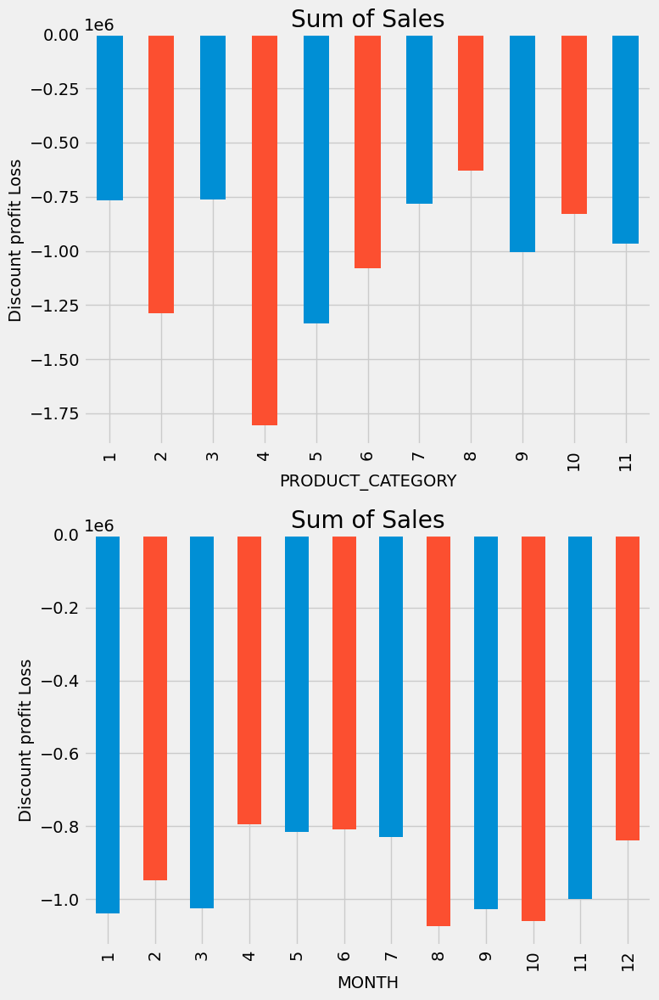

In [180]:
# Create grouped bar plots for different discount-related statistics
groupbyplots_MM_QQ_YY(
    [grouped_discount_Prouct_ID, grouped_discount_MM], 
    plot_type='bar', title='Sum of Sales', ylabel='Discount profit Loss'
)

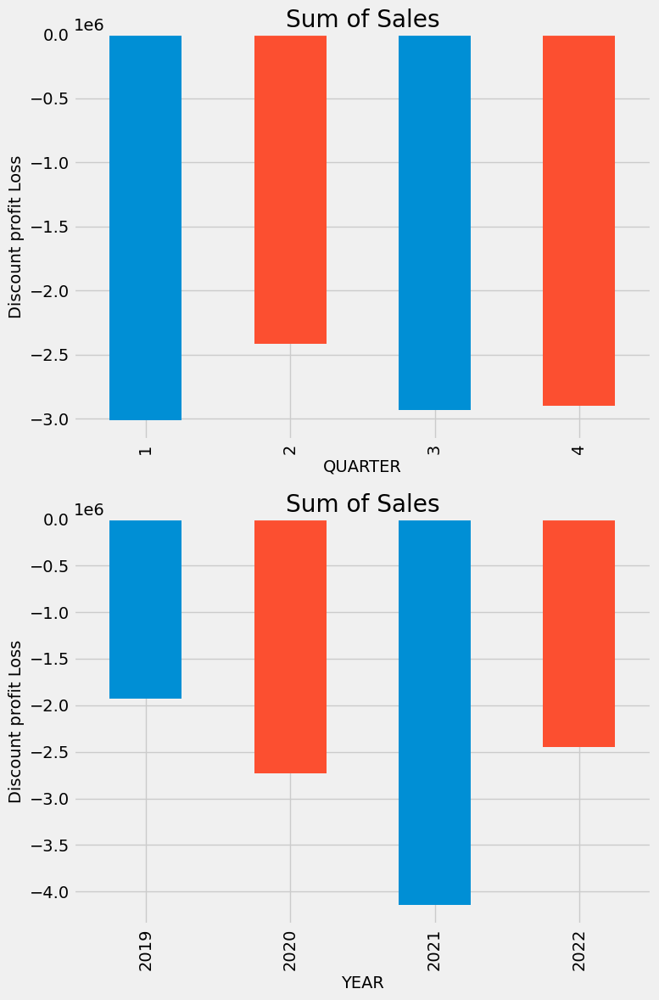

In [181]:
# Create grouped bar plots for different discount-related statistics
groupbyplots_MM_QQ_YY(
    [grouped_discount_QQ, grouped_discount_YY], 
    plot_type='bar', title='Sum of Sales', ylabel='Discount profit Loss'
)

In [182]:
# group the dataframe by Product IDs, Categories, and Age provided
grouped_product_ratings_product_cat = sales_df.groupby(['PRODUCT_CATEGORY'])['PRODUCT_RATING'].mean()
grouped_product_ratings_product_age = sales_df.groupby(['PRODUCT_AGE'])['PRODUCT_RATING'].mean()

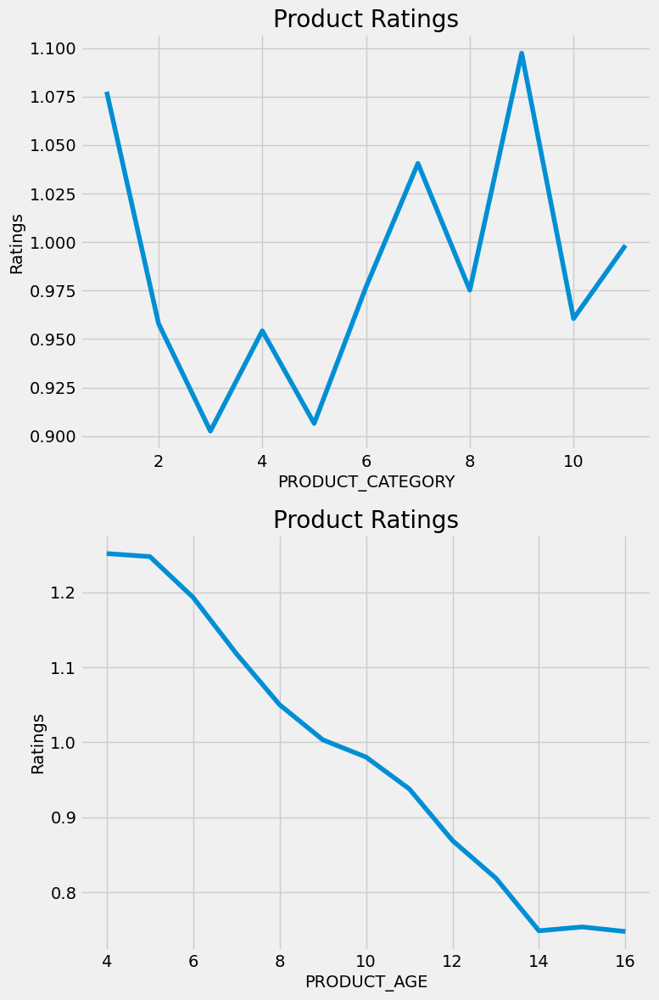

In [183]:
# Create grouped line plots to visualize product ratings by product category and product age
groupbyplots_MM_QQ_YY(
    [grouped_product_ratings_product_cat, grouped_product_ratings_product_age], 
    plot_type='line', title='Product Ratings', ylabel='Ratings'
)

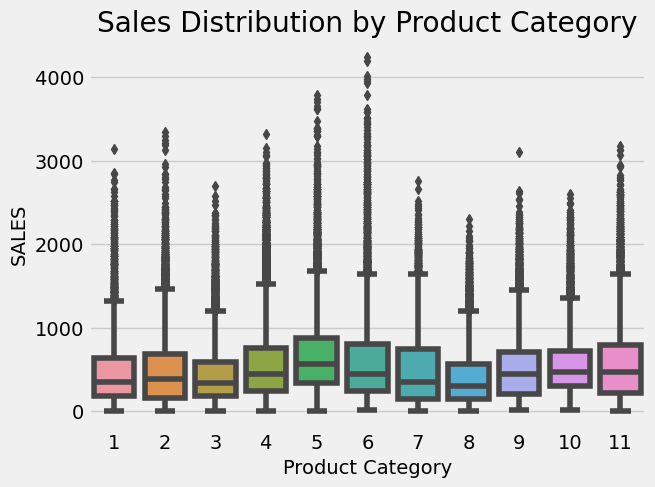

In [184]:
# Create a box plot to visualize the distribution of sales across different product categories
sns.boxplot(x='PRODUCT_CATEGORY', y='SALES', data=sales_df)
plt.title('Sales Distribution by Product Category')
plt.xlabel('Product Category')

# Display the plot
plt.show()


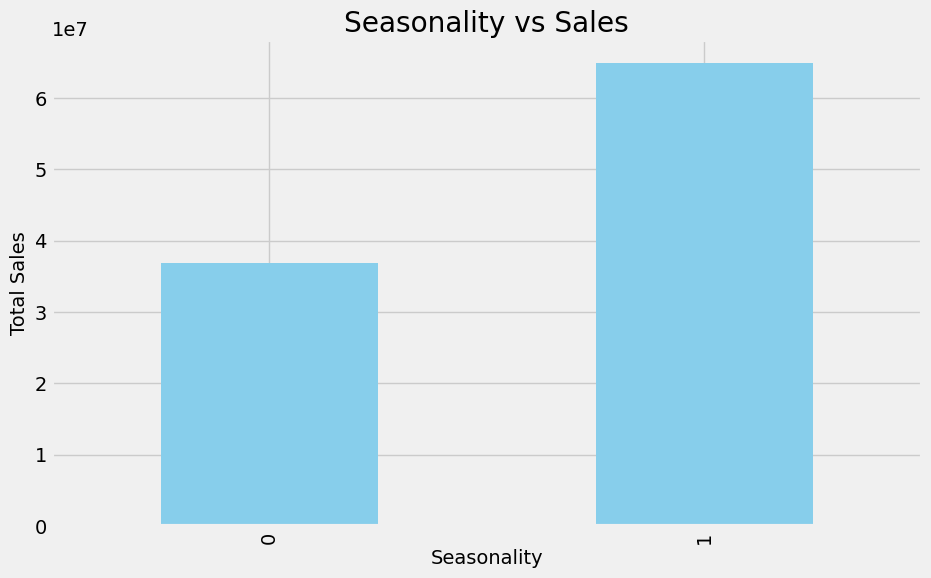

In [185]:
# Create a bar chart to visualize the relationship between seasonality and sales
plt.figure(figsize=(10, 6))  

# Group the data by 'SEASONALITY' and calculate the total sales in each seasonality category
seasonality_sales = sales_df.groupby('SEASONALITY')['SALES'].sum()

# Plot the bar chart
seasonality_sales.plot(kind='bar', color='skyblue')

# Set the title and labels
plt.title('Seasonality vs Sales')
plt.xlabel('Seasonality')
plt.ylabel('Total Sales')

# Display the plot
plt.show()


# Model Development and Evaluation

In [186]:
# Select a subset of columns from the 'sales_df' DataFrame including 'FEATURE_1', 'FEATURE_2', 'FEATURE_3', and 'SALES'
feature_columns = ['FEATURE_1', 'FEATURE_2', 'FEATURE_3', 'SALES']
with_duplicates_sales_df = sales_df[feature_columns]

In [187]:
# Display the first 100 rows of the 'with_duplicates_sales_df' DataFrame
with_duplicates_sales_df.head(100)


,FEATURE_1,FEATURE_2,FEATURE_3,SALES
2019-01-01,-0.656389,0.194415,1.835386,337.80
2019-01-01,-0.478283,3.357257,2.176307,445.20
2019-01-01,-2.027565,1.720003,4.162537,511.03
2019-01-01,-0.132933,5.009023,5.550882,943.41
2019-01-01,1.854769,3.339053,2.207430,655.71
2019-01-01,-0.959161,0.477055,4.258450,718.11
2019-01-01,-0.874811,1.809758,2.972772,202.02
2019-01-01,-1.611404,2.485915,4.828196,501.90
2019-01-01,-0.901128,4.682122,2.158968,425.46
2019-01-01,-1.831260,0.451772,3.697433,411.30


In [188]:
with_duplicates_sales_df.shape

(194000, 4)

In [189]:
# Remove duplicate rows from the 'sales_df' DataFrame based on the index
sales_df_without_duplicates = sales_df[~sales_df.index.duplicated(keep='first')]

In [190]:
# Get the shape (number of rows and columns) of the 'sales_df_without_duplicates' DataFrame
sales_df_without_duplicates.shape

(1461, 23)

In [191]:
# Display the first 100 rows of the 'sales_df_without_duplicates' DataFrame
sales_df_without_duplicates.head(100)

,CUSTOMER_ID,PRODUCT_ID,PRODUCT_CATEGORY,LIST_PRICE,SEASONALITY,CUSTOMER_REGION,LOYALTY_SCORE,SOLD_PRICES,DISCOUNT_OFFERED,PRODUCT_RATING,SHIPPING_TIME,UNITS_ORDERED,SALES,FEATURE_1,FEATURE_2,FEATURE_3,PRODUCT_AGE,MONTH,QUARTER,YEAR,NON_DISCOUNT_SALES,DISCOUNT_AMOUNT,DISCOUNT_PROFIT_LOSS
2019-01-01,3998,154,4,66.23,1,Region_7,6.564614,56.30,15,1.68642,2,6,337.80,-0.656389,0.194415,1.835386,13,1,1,2019,397.38,-9.93,-59.58
2019-01-02,1100,37,2,97.18,1,Region_4,6.138736,84.55,13,1.76280,1,9,760.95,-1.466215,0.512136,11.889692,16,1,1,2019,874.62,-12.63,-113.67
2019-01-03,3490,80,2,18.42,1,Region_7,7.271174,16.21,12,1.70243,2,8,129.68,-0.371628,0.414922,4.433287,9,1,1,2019,147.36,-2.21,-17.68
2019-01-04,1940,22,7,53.96,1,Region_6,6.736121,44.25,18,1.13853,3,7,309.75,-0.584304,2.335785,1.380361,16,1,1,2019,377.72,-9.71,-67.97
2019-01-05,2278,195,9,63.96,1,Region_6,6.700864,62.04,3,0.00000,11,11,682.44,1.099415,0.526934,3.623915,7,1,1,2019,703.56,-1.92,-21.12
2019-01-06,405,26,9,41.69,1,Region_4,10.571966,36.27,13,0.00000,5,5,181.35,-0.091574,4.175189,2.548286,14,1,1,2019,208.45,-5.42,-27.10
2019-01-07,532,50,5,22.41,1,Region_10,10.531375,19.94,11,1.01797,6,11,219.34,1.921200,2.731355,9.129191,11,1,1,2019,246.51,-2.47,-27.17
2019-01-08,454,27,9,25.39,1,Region_7,10.537531,22.09,13,0.00000,3,10,220.90,-1.485723,0.820576,2.251121,7,1,1,2019,253.90,-3.30,-33.00
2019-01-09,432,85,10,48.53,1,Region_4,10.503175,42.22,13,0.03766,2,11,464.42,0.352638,0.296393,4.230493,5,1,1,2019,533.83,-6.31,-69.41
2019-01-10,393,189,1,62.32,1,Region_10,6.857221,52.35,16,0.62159,0,8,418.80,-1.941967,0.006658,4.898440,10,1,1,2019,498.56,-9.97,-79.76


In [192]:
# Select a subset of columns from the 'sales_df_without_duplicates' DataFrame
feature_columns = ['FEATURE_1', 'FEATURE_2', 'FEATURE_3', 'SALES']
new_sales_df = sales_df_without_duplicates[feature_columns]

In [193]:
# Display the first 10 rows of the 'new_sales_df' DataFrame
new_sales_df.head(10)

,FEATURE_1,FEATURE_2,FEATURE_3,SALES
2019-01-01,-0.656389,0.194415,1.835386,337.80
2019-01-02,-1.466215,0.512136,11.889692,760.95
2019-01-03,-0.371628,0.414922,4.433287,129.68
2019-01-04,-0.584304,2.335785,1.380361,309.75
2019-01-05,1.099415,0.526934,3.623915,682.44
2019-01-06,-0.091574,4.175189,2.548286,181.35
2019-01-07,1.921200,2.731355,9.129191,219.34
2019-01-08,-1.485723,0.820576,2.251121,220.90
2019-01-09,0.352638,0.296393,4.230493,464.42
2019-01-10,-1.941967,0.006658,4.898440,418.80


In [194]:
# This operation aggregates data based on the index, potentially consolidating rows with the same index.
with_duplicates_sales_groupby_df = with_duplicates_sales_df.groupby(with_duplicates_sales_df.index).sum()

In [195]:
# Display the first few rows of the 'with_duplicates_sales_groupby_df' DataFrame
with_duplicates_sales_groupby_df.head()

,FEATURE_1,FEATURE_2,FEATURE_3,SALES
2019-01-01,8.740310,330.079407,659.799624,61641.48
2019-01-02,-5.968507,227.436743,548.986369,49927.27
2019-01-03,0.272635,201.571187,418.015066,41555.73
2019-01-04,-13.185758,238.804985,478.329505,43194.74
2019-01-05,-2.518037,222.522765,518.584766,49244.77


In [196]:
# Function to create a correlation heat map from a DataFrame
def create_corr_heat_map(df):
    """
    Create a correlation heat map from a DataFrame.
    Args:
        df (DataFrame): The input DataFrame for which the correlation heat map is generated.
    """
    # Calculate the correlation matrix
    corr_mat = df.corr()

    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(10, 8))

    # Create a custom color map
    cmap = sns.diverging_palette(250, 10, as_cmap=True)

    # Plot the heatmap
    sns.heatmap(corr_mat, cmap=cmap, center=0, annot=True, square=True, linewidths=0.5, cbar_kws={"shrink": 1})

    # Customize the plot
    plt.title('Sales Correlation Plot')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)

    # Show the plot
    plt.show()


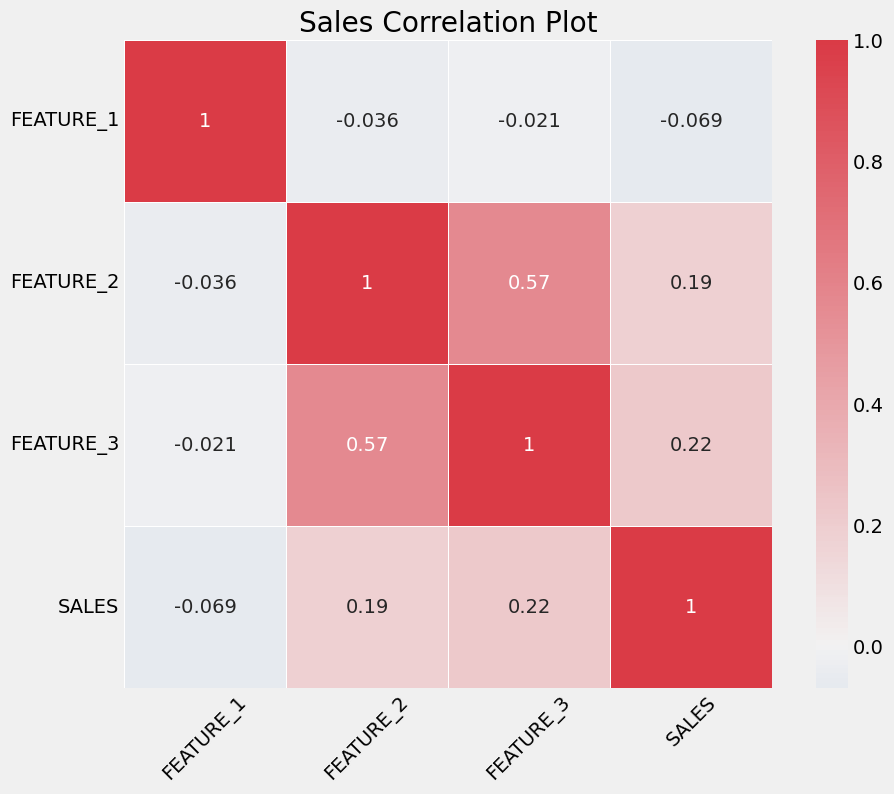

In [197]:
# Generate a correlation heatmap
create_corr_heat_map(with_duplicates_sales_groupby_df)

In [198]:
 with_duplicates_sales_groupby_df.columns

Index(['FEATURE_1', 'FEATURE_2', 'FEATURE_3', 'SALES'], dtype='object')

In [199]:
col_list = ['FEATURE_1', 'FEATURE_2', 'FEATURE_3']

In [200]:
# Function to create scatter plots to visualize the relationship between features and a target variable
def scatter_plot(df_feat, df_tar, col_list):
    """
    Create scatter plots to visualize the relationship between features and a target variable.
    Args:
        df_feat (DataFrame): The DataFrame containing feature columns.
        df_tar (DataFrame): The DataFrame containing the target variable.
        col_list (list): A list of column names (features) to plot against the target variable.
    """
    target_col = df_tar.columns[0]  
    target_name = target_col.capitalize()

    for i, feature in enumerate(col_list, 1):
        plt.figure(i)  
        plt.scatter(df_tar[target_col], df_feat[feature])

        # Set labels and title for each plot
        plt.xlabel(target_name)
        plt.ylabel(feature)
        plt.title(f'Scatter Plot: {feature} vs {target_name}')

        # Show the plot
        plt.show()


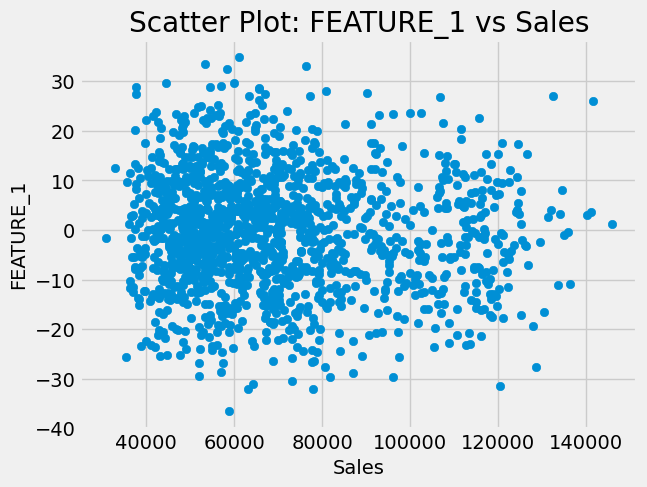

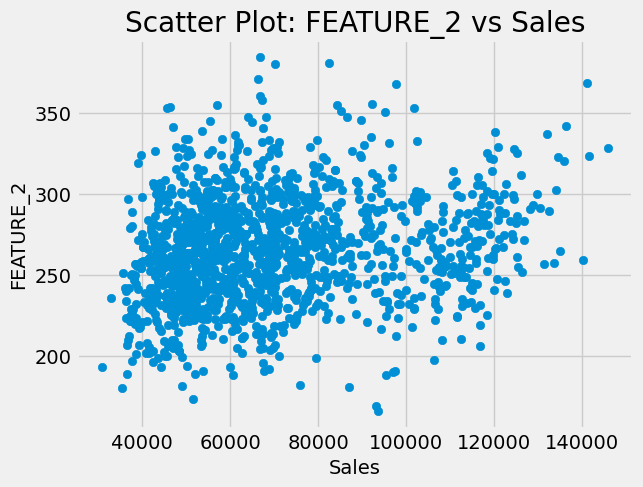

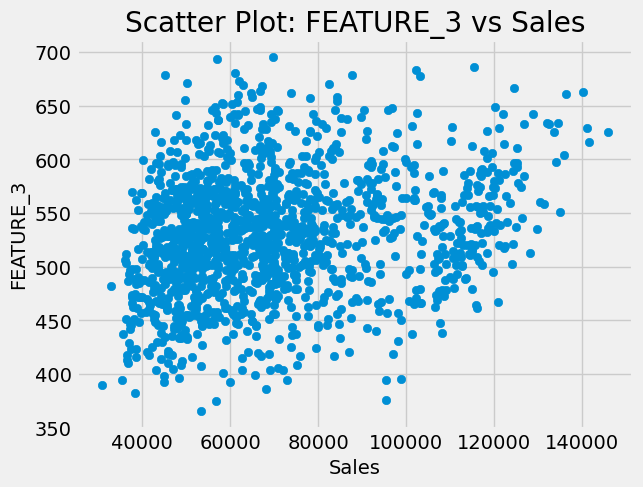

In [201]:
# Create scatter plots to visualize the relationship between 'FEATURE_1', 'FEATURE_2', 'FEATURE_3' and 'SALES'
scatter_plot(
    with_duplicates_sales_groupby_df[['FEATURE_1', 'FEATURE_2', 'FEATURE_3']], 
    with_duplicates_sales_groupby_df[['SALES']], col_list
)

In [202]:
def exp_trans(df):
    """
    Apply an exponential transformation using the expit function to each element in a DataFrame.
    Args:
        df (DataFrame): The input DataFrame to be transformed.
    Returns:
        DataFrame: A new DataFrame with transformed columns suffixed by '_exp'.
    """
    # Apply the expit function to each element in the DataFrame
    exp_columns = df.applymap(lambda x: expit(x)) 

    # Generate names for the transformed columns with '_exp' suffixes
    exp_column_names = [f"{col}_exp" for col in df.columns] 

    # Concatenate the original DataFrame with the transformed columns
    df_exp = pd.concat([df, exp_columns], axis=1)

    # Rename the columns to include the '_exp' suffixes
    df_exp.columns = df.columns.tolist() + exp_column_names

    return df_exp

with_duplicates_sales_groupby_df = exp_trans(with_duplicates_sales_groupby_df)

In [203]:
with_duplicates_sales_groupby_df.head(10)

,FEATURE_1,FEATURE_2,FEATURE_3,SALES,FEATURE_1_exp,FEATURE_2_exp,FEATURE_3_exp,SALES_exp
2019-01-01,8.740310,330.079407,659.799624,61641.48,0.999840,1.0,1.0,1.0
2019-01-02,-5.968507,227.436743,548.986369,49927.27,0.002552,1.0,1.0,1.0
2019-01-03,0.272635,201.571187,418.015066,41555.73,0.567740,1.0,1.0,1.0
2019-01-04,-13.185758,238.804985,478.329505,43194.74,0.000002,1.0,1.0,1.0
2019-01-05,-2.518037,222.522765,518.584766,49244.77,0.074603,1.0,1.0,1.0
2019-01-06,1.536977,246.566356,541.091444,54849.33,0.823025,1.0,1.0,1.0
2019-01-07,-4.067898,261.440021,489.305193,49595.36,0.016825,1.0,1.0,1.0
2019-01-08,-13.586202,237.508325,461.582959,48492.45,0.000001,1.0,1.0,1.0
2019-01-09,-4.606913,228.283514,525.330286,48954.51,0.009884,1.0,1.0,1.0
2019-01-10,-9.016691,221.609536,536.675230,50523.80,0.000121,1.0,1.0,1.0


In [204]:
with_duplicates_sales_groupby_df.shape

(1461, 8)

In [205]:
# Function to remove columns with names ending in specified suffixes
def remove_columns_ending_with(data_frame, suffixes):
    """
    Remove columns from a DataFrame with names ending in specified suffixes.
    Args:
        data_frame (DataFrame): The input DataFrame.
        suffixes (str or tuple of str): Suffixes to match for column removal.
    Returns:
        DataFrame: DataFrame containing only the columns that do not end with specified suffixes.
        DataFrame: DataFrame containing only the columns that end with specified suffixes.
    """
    columns_to_remove = [col for col in data_frame.columns if col.endswith(suffixes)]
    df_with_tar = data_frame[columns_to_remove]
    df_without_tar = data_frame.drop(columns=columns_to_remove)
    return df_with_tar, df_without_tar


def compute_lags_spreads_for_pred(df, num_lags=7):
    new_df = df.copy()

    # Create a list to hold the new spread columns
    spread_columns = [col + '_spread' for col in new_df.columns]

    # Calculate the spreads for all columns at once using pd.concat(axis=1)
    spread_data = new_df.diff().dropna()
    spread_data.columns = spread_columns
    new_df = pd.concat([new_df, spread_data], axis=1)
    new_df.dropna(inplace=True)
    
    # Create a list to hold the new columns
    new_columns = []

    for col in new_df.columns:
        for lag in range(1, num_lags + 1):
            new_col_name = col + '_lag_' + str(lag)
            new_columns.append(new_col_name)

    # Create lagged columns using pd.concat(axis=1)
    lagged_data = []
    for col in new_df.columns:
        lagged_cols = [new_df[col].shift(l) for l in range(1, num_lags + 1)]
        lagged_data.extend(lagged_cols)
    lagged_df = pd.concat(lagged_data, axis=1)
    lagged_df.columns = new_columns

    # Combine spread and lagged columns
    combined_df = pd.concat([new_df, lagged_df], axis=1)
    combined_df.dropna(inplace=True)
    

    y, X = remove_columns_ending_with(combined_df, ('_spread', '_exp_spread', '_exp'))

    return X


with_duplicates_sales_groupby_df = compute_lags_spreads_for_pred(with_duplicates_sales_groupby_df)


with_duplicates_sales_groupby_df = with_duplicates_sales_groupby_df.copy()

In [206]:
# Calculate the correlation matrix for the 'with_duplicates_sales_groupby_df' DataFrame
corr_matrix_sales_df = with_duplicates_sales_groupby_df.corr()

In [207]:
corr_matrix_sales_df.head(40)

,FEATURE_1,FEATURE_2,FEATURE_3,SALES,FEATURE_1_lag_1,FEATURE_1_lag_2,FEATURE_1_lag_3,FEATURE_1_lag_4,FEATURE_1_lag_5,FEATURE_1_lag_6,FEATURE_1_lag_7,FEATURE_2_lag_1,FEATURE_2_lag_2,FEATURE_2_lag_3,FEATURE_2_lag_4,FEATURE_2_lag_5,FEATURE_2_lag_6,FEATURE_2_lag_7,FEATURE_3_lag_1,FEATURE_3_lag_2,FEATURE_3_lag_3,FEATURE_3_lag_4,FEATURE_3_lag_5,FEATURE_3_lag_6,FEATURE_3_lag_7,SALES_lag_1,SALES_lag_2,SALES_lag_3,SALES_lag_4,SALES_lag_5,SALES_lag_6,SALES_lag_7,FEATURE_1_exp_lag_1,FEATURE_1_exp_lag_2,FEATURE_1_exp_lag_3,FEATURE_1_exp_lag_4,FEATURE_1_exp_lag_5,FEATURE_1_exp_lag_6,FEATURE_1_exp_lag_7,FEATURE_2_exp_lag_1,FEATURE_2_exp_lag_2,FEATURE_2_exp_lag_3,FEATURE_2_exp_lag_4,FEATURE_2_exp_lag_5,FEATURE_2_exp_lag_6,FEATURE_2_exp_lag_7,FEATURE_3_exp_lag_1,FEATURE_3_exp_lag_2,FEATURE_3_exp_lag_3,FEATURE_3_exp_lag_4,FEATURE_3_exp_lag_5,FEATURE_3_exp_lag_6,FEATURE_3_exp_lag_7,SALES_exp_lag_1,SALES_exp_lag_2,SALES_exp_lag_3,SALES_exp_lag_4,SALES_exp_lag_5,SALES_exp_lag_6,SALES_exp_lag_7,FEATURE_1_spread_lag_1,FEATURE_1_spread_lag_2,FEATURE_1_spread_lag_3,FEATURE_1_spread_lag_4,FEATURE_1_spread_lag_5,FEATURE_1_spread_lag_6,FEATURE_1_spread_lag_7,FEATURE_2_spread_lag_1,FEATURE_2_spread_lag_2,FEATURE_2_spread_lag_3,FEATURE_2_spread_lag_4,FEATURE_2_spread_lag_5,FEATURE_2_spread_lag_6,FEATURE_2_spread_lag_7,FEATURE_3_spread_lag_1,FEATURE_3_spread_lag_2,FEATURE_3_spread_lag_3,FEATURE_3_spread_lag_4,FEATURE_3_spread_lag_5,FEATURE_3_spread_lag_6,FEATURE_3_spread_lag_7,SALES_spread_lag_1,SALES_spread_lag_2,SALES_spread_lag_3,SALES_spread_lag_4,SALES_spread_lag_5,SALES_spread_lag_6,SALES_spread_lag_7,FEATURE_1_exp_spread_lag_1,FEATURE_1_exp_spread_lag_2,FEATURE_1_exp_spread_lag_3,FEATURE_1_exp_spread_lag_4,FEATURE_1_exp_spread_lag_5,FEATURE_1_exp_spread_lag_6,FEATURE_1_exp_spread_lag_7,FEATURE_2_exp_spread_lag_1,FEATURE_2_exp_spread_lag_2,FEATURE_2_exp_spread_lag_3,FEATURE_2_exp_spread_lag_4,FEATURE_2_exp_spread_lag_5,FEATURE_2_exp_spread_lag_6,FEATURE_2_exp_spread_lag_7,FEATURE_3_exp_spread_lag_1,FEATURE_3_exp_spread_lag_2,FEATURE_3_exp_spread_lag_3,FEATURE_3_exp_spread_lag_4,FEATURE_3_exp_spread_lag_5,FEATURE_3_exp_spread_lag_6,FEATURE_3_exp_spread_lag_7,SALES_exp_spread_lag_1,SALES_exp_spread_lag_2,SALES_exp_spread_lag_3,SALES_exp_spread_lag_4,SALES_exp_spread_lag_5,SALES_exp_spread_lag_6,SALES_exp_spread_lag_7
FEATURE_1,1.000000,-0.038530,-0.024128,-0.070813,0.009036,-0.034338,-0.002760,-0.011624,0.024166,0.002763,-0.012238,-0.003096,0.035525,-0.003610,0.014212,-0.032698,0.047177,0.003523,-0.033984,0.025393,-0.005123,0.044270,-0.012641,0.015027,-0.032612,-0.062423,-0.048399,-0.072103,-0.056789,-0.056808,-0.054273,-0.065380,0.029968,-0.009754,-0.029054,-0.003668,0.016970,-0.001238,-0.041156,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.030806,-0.022441,0.006293,-0.025441,0.015212,0.010662,-0.007749,-0.027921,0.028295,-0.012892,0.033946,-0.057831,0.031641,0.025359,-0.043198,0.022199,-3.593224e-02,0.041400,-0.020145,0.034669,-0.041057,-0.030873,0.052231,-0.033726,0.000081,-0.005556,0.024457,-0.021347,0.028521,0.013856,-0.018220,-0.014822,0.013073,0.028666,-0.016365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FEATURE_2,-0.038530,1.000000,0.563799,0.183074,-0.011359,-0.019014,-0.035587,0.004065,0.013507,0.000174,-0.033483,0.043253,0.005971,-0.024155,0.010678,-0.009587,0.034567,0.079122,0.002502,0.028629,-0.007185,0.021747,-0.012496,0.001233,0.064214,0.023542,0.015064,-0.004634,0.002350,-0.000392,-0.004482,0.017993,-0.015071,-0.015503,-0.026256,0.013698,0.001803,-0.004158,-0.043030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005434,0.011770,-0.028169,-0.006703,0.009476,0.023921,-0.027680,0.026952,0.021777,-0.025191,0.014665,-0.031976,-0.032277,0.044386,-0.019010,0.026054,-2.104773e-02,0.024911,-0.009991,-0.045833,0.054860,0.018669,0.043402,-0.015389,0.006041,0.009019,-0.049535,0.029318,0.000310,0.007719,-0.028675,0.008543,0.004279,

In [208]:
# Separate features (X) and the target variable (y) in the DataFrame
X_features = with_duplicates_sales_groupby_df.drop('SALES', axis=1)
y_target = with_duplicates_sales_groupby_df[['SALES']]

In [209]:
X_features

,FEATURE_1,FEATURE_2,FEATURE_3,FEATURE_1_lag_1,FEATURE_1_lag_2,FEATURE_1_lag_3,FEATURE_1_lag_4,FEATURE_1_lag_5,FEATURE_1_lag_6,FEATURE_1_lag_7,FEATURE_2_lag_1,FEATURE_2_lag_2,FEATURE_2_lag_3,FEATURE_2_lag_4,FEATURE_2_lag_5,FEATURE_2_lag_6,FEATURE_2_lag_7,FEATURE_3_lag_1,FEATURE_3_lag_2,FEATURE_3_lag_3,FEATURE_3_lag_4,FEATURE_3_lag_5,FEATURE_3_lag_6,FEATURE_3_lag_7,SALES_lag_1,SALES_lag_2,SALES_lag_3,SALES_lag_4,SALES_lag_5,SALES_lag_6,SALES_lag_7,FEATURE_1_exp_lag_1,FEATURE_1_exp_lag_2,FEATURE_1_exp_lag_3,FEATURE_1_exp_lag_4,FEATURE_1_exp_lag_5,FEATURE_1_exp_lag_6,FEATURE_1_exp_lag_7,FEATURE_2_exp_lag_1,FEATURE_2_exp_lag_2,FEATURE_2_exp_lag_3,FEATURE_2_exp_lag_4,FEATURE_2_exp_lag_5,FEATURE_2_exp_lag_6,FEATURE_2_exp_lag_7,FEATURE_3_exp_lag_1,FEATURE_3_exp_lag_2,FEATURE_3_exp_lag_3,FEATURE_3_exp_lag_4,FEATURE_3_exp_lag_5,FEATURE_3_exp_lag_6,FEATURE_3_exp_lag_7,SALES_exp_lag_1,SALES_exp_lag_2,SALES_exp_lag_3,SALES_exp_lag_4,SALES_exp_lag_5,SALES_exp_lag_6,SALES_exp_lag_7,FEATURE_1_spread_lag_1,FEATURE_1_spread_lag_2,FEATURE_1_spread_lag_3,FEATURE_1_spread_lag_4,FEATURE_1_spread_lag_5,FEATURE_1_spread_lag_6,FEATURE_1_spread_lag_7,FEATURE_2_spread_lag_1,FEATURE_2_spread_lag_2,FEATURE_2_spread_lag_3,FEATURE_2_spread_lag_4,FEATURE_2_spread_lag_5,FEATURE_2_spread_lag_6,FEATURE_2_spread_lag_7,FEATURE_3_spread_lag_1,FEATURE_3_spread_lag_2,FEATURE_3_spread_lag_3,FEATURE_3_spread_lag_4,FEATURE_3_spread_lag_5,FEATURE_3_spread_lag_6,FEATURE_3_spread_lag_7,SALES_spread_lag_1,SALES_spread_lag_2,SALES_spread_lag_3,SALES_spread_lag_4,SALES_spread_lag_5,SALES_spread_lag_6,SALES_spread_lag_7,FEATURE_1_exp_spread_lag_1,FEATURE_1_exp_spread_lag_2,FEATURE_1_exp_spread_lag_3,FEATURE_1_exp_spread_lag_4,FEATURE_1_exp_spread_lag_5,FEATURE_1_exp_spread_lag_6,FEATURE_1_exp_spread_lag_7,FEATURE_2_exp_spread_lag_1,FEATURE_2_exp_spread_lag_2,FEATURE_2_exp_spread_lag_3,FEATURE_2_exp_spread_lag_4,FEATURE_2_exp_spread_lag_5,FEATURE_2_exp_spread_lag_6,FEATURE_2_exp_spread_lag_7,FEATURE_3_exp_spread_lag_1,FEATURE_3_exp_spread_lag_2,FEATURE_3_exp_spread_lag_3,FEATURE_3_exp_spread_lag_4,FEATURE_3_exp_spread_lag_5,FEATURE_3_exp_spread_lag_6,FEATURE_3_exp_spread_lag_7,SALES_exp_spread_lag_1,SALES_exp_spread_lag_2,SALES_exp_spread_lag_3,SALES_exp_spread_lag_4,SALES_exp_spread_lag_5,SALES_exp_spread_lag_6,SALES_exp_spread_lag_7
2019-01-09,-4.606913,228.283514,525.330286,-13.586202,-4.067898,1.536977,-2.518037,-13.185758,0.272635,-5.968507,237.508325,261.440021,246.566356,222.522765,238.804985,201.571187,227.436743,461.582959,489.305193,541.091444,518.584766,478.329505,418.015066,548.986369,48492.45,49595.36,54849.33,49244.77,43194.74,41555.73,49927.27,1.257728e-06,1.682539e-02,8.230248e-01,7.460335e-02,1.877142e-06,5.677397e-01,2.551530e-03,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-9.518305,-5.604874,4.055014,10.667721,-13.458393,6.241142,-14.708817,-23.931696,14.873665,24.043591,-16.282220,37.233798,-25.865556,-102.642664,-27.722234,-51.786251,22.506678,40.255261,60.314439,-130.971302,-110.813256,-1102.91,-5253.97,5604.56,6050.03,1639.01,-8371.54,-11714.21,-1.682413e-02,-8.061994e-01,7.484214e-01,7.460148e-02,-5.677378e-01,5.651882e-01,-9.972885e-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-10,-9.016691,221.609536,536.675230,-4.606913,-13.586202,-4.067898,1.536977,-2.518037,-13.185758,0.272635,228.283514,237.508325,261.440021,246.566356,222.522765,238.804985,201.571187,525.330286,461.582959,489.305193,541.091444,518.584766,478.329505,418.015066,48954.51,48492.45,49595.36,54849.33,49244.77,43194.74,41555.73,9.883920e-03,1.257728e-06,1.682539e-02,8.230248e-01,7.460335e-02,1.877142e-06,5.677397e-01,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,8.979289,-9.518305,-5.604874,4.055014,10.667721,-13.458393,6.241142,-9.224811,-23.931696,14.873665,24.043591,-16.282220,37.233798,-25.865556,63.747327,-27.722234,-51.786251,22.506678,40.255261,60.314439

In [210]:
y_target

,SALES
2019-01-09,48954.51
2019-01-10,50523.80
2019-01-11,53650.24
2019-01-12,52119.05
2019-01-13,44334.11
2019-01-14,49529.49
2019-01-15,51875.74
2019-01-16,43072.79
2019-01-17,45109.69
2019-01-18,43572.87


In [211]:
y_target.shape

(1453, 1)

In [212]:
# Function to construct and fit multiple regression models
def model_pred_construct(X, y):
    """
    Construct and fit multiple regression models using various algorithms.
    Args:
        X (DataFrame or array-like): Features for training.
        y (DataFrame or array-like): Target variable for training.

    Returns:
        Various trained regression models.
        Data splits for testing and training.
    """
    # Scale the features
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.05, shuffle=False, random_state=23)
    
    # Initialize and fit regression models
    model_rf = RandomForestRegressor(max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=1000)
    model_gb = GradientBoostingRegressor(validation_fraction=0.1, learning_rate=0.01, max_depth=20, n_estimators=1500, subsample=0.5)
    model_svm = SVR(C=0.1, gamma=1, kernel = 'poly')
    model_knn = KNeighborsRegressor(n_neighbors=5)
    model_xgb = XGBRegressor()
    model_ada = AdaBoostRegressor()
    model_sgd = SGDRegressor()
    model_lgbm = LGBMRegressor(num_leaves=100, learning_rate=0.01, max_depth=20, n_estimators=1500, n_jobs=2, subsample=0.5, verbose=0)
    model_rf_fit = model_rf.fit(X_train, y_train.values.ravel())
    model_gb_fit = model_gb.fit(X_train, y_train.values.ravel())
    model_svr_fit = model_svm.fit(X_train, y_train.values.ravel())
    model_knn_fit = model_knn.fit(X_train, y_train.values.ravel())
    model_xgb_fit = model_xgb.fit(X_train, y_train.values.ravel())
    model_ada_fit = model_ada.fit(X_train, y_train.values.ravel())
    model_sgd_fit = model_sgd.fit(X_train, y_train.values.ravel())
    model_lgbm_fit = model_lgbm.fit(X_train, y_train.values.ravel())
    
    return model_rf_fit, model_gb_fit, model_svr_fit, model_knn_fit, model_xgb_fit, model_ada_fit, model_sgd_fit, model_lgbm_fit, X_test, y_test, X_train, y_train

# Call the function to obtain trained models and data splits
model_rf_fit, model_gb_fit, model_svr_fit, model_knn_fit, model_xgb_fit, model_ada_fit, model_sgd_fit, model_lgbm_fit, X_test, y_test, X_train, y_train = model_pred_construct(X_features, y_target)


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [213]:
# Function to calculate and display various evaluation metrics
def get_accuracy(actual, pred):
    """
    Calculate and display various evaluation metrics for regression models.
    Args:
        actual (array-like): True target values.
        pred (array-like): Predicted target values.
    """
    
    mse = mean_squared_error(actual, pred)
    rmse = math.sqrt(mse)
    r_square = r2_score(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    
    # Print evaluation metrics
    print(f"Mean Square Error: {mse}\n"
          f"______\n"
          f"Root Mean Square Error: {rmse}\n"
          f"______\n"
          f"R_Score: {r_square}\n"
          f"______\n"
          f"Mean Absolute Percentage Error: {mape}")

# Function to evaluate a regression model's performance and visualize predictions
def model_evaluation(model, X_test, y_test):
    """
    Evaluate a regression model's performance and visualize predictions.
    Args:
        model: Trained regression model.
        X_test (array-like): Features for testing.
        y_test (array-like): True target values for testing.
    """
    # Make predictions using the trained model
    prediction = model.predict(X_test)
    # Calculate and display evaluation metrics
    get_accuracy(y_test, prediction)
    
    # Create a DataFrame with predicted and actual values
    prediction_df = pd.DataFrame(prediction, columns=['Prediction'], index=y_test.index)
    df_result = pd.concat([prediction_df, y_test], axis=1)
    df_result = pd.concat([prediction_df, y_test], axis=1)
    print(df_result)
    # Plot predictions vs. actual values
    plt.plot(df_result, label=['Prediction', 'Actual'])
    plt.legend(loc='upper right')
    plt.show()
     

## Random Forest Algorithm

Model accuracy for aFRR Up - Random Forest
Mean Square Error: 52179381.65263343
______
Root Mean Square Error: 7223.529722554856
______
R_Score: 0.4971840058421857
______
Mean Absolute Percentage Error: 0.0997498270136552
              Prediction     SALES
2022-10-20  67661.304639  56957.54
2022-10-21  61744.888540  73081.05
2022-10-22  72746.965676  62742.98
2022-10-23  72351.906648  54584.54
2022-10-24  66207.175233  70657.09
2022-10-25  60607.113606  60767.55
2022-10-26  63935.375858  56998.69
2022-10-27  60853.106887  73595.04
2022-10-28  63392.726405  67328.23
2022-10-29  65766.877571  71601.51
2022-10-30  72008.554109  81710.93
2022-10-31  65927.751521  66179.11
2022-11-01  65730.160761  49009.52
2022-11-02  66095.395864  67437.37
2022-11-03  69573.764901  65777.49
2022-11-04  69884.596828  72732.49
2022-11-05  67574.323586  60311.93
2022-11-06  65748.206322  60167.25
2022-11-07  59306.567664  66457.81
2022-11-08  69434.960937  56459.57
2022-11-09  64524.213686  83986.35
2022-11-

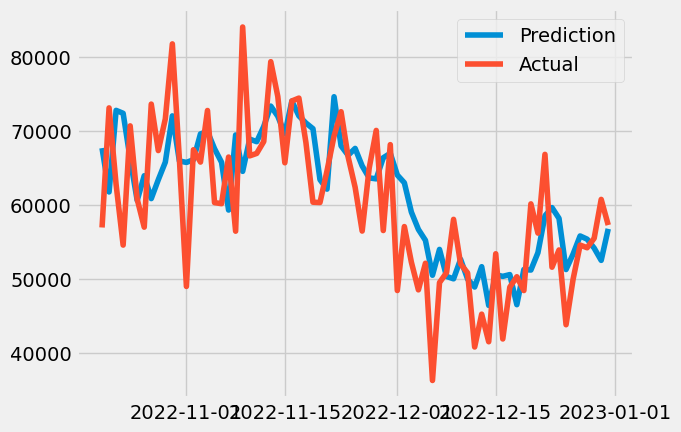

In [214]:
print(f"Model accuracy for aFRR Up - Random Forest")
model_evaluation(model_rf_fit, X_test, y_test)

## Gradient Boosting Algorithm

Model accuracy for - Gradient Boosting
Mean Square Error: 50222838.7808679
______
Root Mean Square Error: 7086.807375741766
______
R_Score: 0.5160378331207143
______
Mean Absolute Percentage Error: 0.09672990578720118
              Prediction     SALES
2022-10-20  66156.242975  56957.54
2022-10-21  61697.000372  73081.05
2022-10-22  72333.202240  62742.98
2022-10-23  73737.688875  54584.54
2022-10-24  65992.044749  70657.09
2022-10-25  58634.171108  60767.55
2022-10-26  66048.245467  56998.69
2022-10-27  61934.196051  73595.04
2022-10-28  61816.788301  67328.23
2022-10-29  64298.470653  71601.51
2022-10-30  73287.108940  81710.93
2022-10-31  65604.278586  66179.11
2022-11-01  64703.120658  49009.52
2022-11-02  66282.880606  67437.37
2022-11-03  72106.457207  65777.49
2022-11-04  70411.361527  72732.49
2022-11-05  65188.254992  60311.93
2022-11-06  63103.125200  60167.25
2022-11-07  61160.058726  66457.81
2022-11-08  69949.270987  56459.57
2022-11-09  65779.198471  83986.35
2022-11-10  

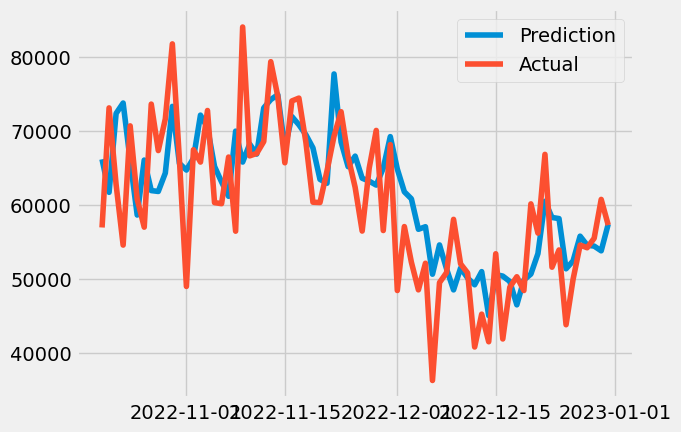

In [223]:
print(f"Model accuracy for - Gradient Boosting")
model_evaluation(model_gb_fit, X_test, y_test)

In [216]:
# Function to evaluate feature importance for a given model
def feature_importance_eval(model, X):
    """
    Evaluate feature importance for a given regression model.
    Args:
        model: Trained regression model.
        X (DataFrame): Features used for training.
    Returns:
        DataFrame: DataFrame containing feature names and their importance scores.
    """
    
    feature_importances = model.feature_importances_
    print("Shape of X_up_features:", X.shape)
    print("Length of feature_importances_:", len(feature_importances))
    importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
    # Sort the DataFrame by importance scores in descending order
    importance_df = importance_df.sort_values(by='Importance', ascending=False)                          
    return importance_df

## Feature Importances for Random Forest Algorithm

In [217]:
importance_df = feature_importance_eval(model_rf_fit, X_features)
importance_df.head(90)

Shape of X_up_features: (1453, 115)
Length of feature_importances_: 115


,Feature,Importance
24,SALES_lag_1,0.678253
25,SALES_lag_2,0.134354
27,SALES_lag_4,0.047138
2,FEATURE_3,0.031601
1,FEATURE_2,0.016225
26,SALES_lag_3,0.014015
28,SALES_lag_5,0.012452
29,SALES_lag_6,0.008961
30,SALES_lag_7,0.006825
17,FEATURE_3_lag_1,0.002223


## Support Vector Regressor 

Model accuracy for Support Vector Regressor
Mean Square Error: 54264365.76438849
______
Root Mean Square Error: 7366.435078407227
______
R_Score: 0.47709248068892707
______
Mean Absolute Percentage Error: 0.10520523537851383
              Prediction     SALES
2022-10-20  68752.485800  56957.54
2022-10-21  65467.888804  73081.05
2022-10-22  67093.281967  62742.98
2022-10-23  67363.530283  54584.54
2022-10-24  67024.600628  70657.09
2022-10-25  62242.337576  60767.55
2022-10-26  62527.905245  56998.69
2022-10-27  61303.908705  73595.04
2022-10-28  62513.029752  67328.23
2022-10-29  62633.867537  71601.51
2022-10-30  66064.329585  81710.93
2022-10-31  65696.587748  66179.11
2022-11-01  61784.611940  49009.52
2022-11-02  63943.084907  67437.37
2022-11-03  65831.451996  65777.49
2022-11-04  64695.282363  72732.49
2022-11-05  65763.228349  60311.93
2022-11-06  63968.833354  60167.25
2022-11-07  61218.826331  66457.81
2022-11-08  64716.000570  56459.57
2022-11-09  64863.916855  83986.35
2022-

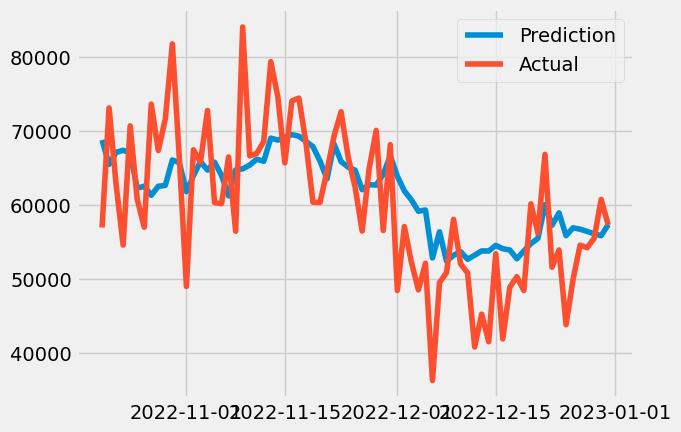

In [218]:
print(f"Model accuracy for Support Vector Regressor")
model_evaluation(model_svr_fit, X_test, y_test)

## XGBOOST 

Model accuracy for - XGBOOST
Mean Square Error: 51859793.94195051
______
Root Mean Square Error: 7201.374448114089
______
R_Score: 0.5002636477884514
______
Mean Absolute Percentage Error: 0.09928568875498218
              Prediction     SALES
2022-10-20  65605.585938  56957.54
2022-10-21  58195.484375  73081.05
2022-10-22  73149.171875  62742.98
2022-10-23  68461.296875  54584.54
2022-10-24  74702.539062  70657.09
2022-10-25  51844.140625  60767.55
2022-10-26  66453.781250  56998.69
2022-10-27  58010.187500  73595.04
2022-10-28  60224.671875  67328.23
2022-10-29  66868.085938  71601.51
2022-10-30  82338.304688  81710.93
2022-10-31  64994.984375  66179.11
2022-11-01  67349.507812  49009.52
2022-11-02  66913.242188  67437.37
2022-11-03  69253.437500  65777.49
2022-11-04  73403.906250  72732.49
2022-11-05  68197.593750  60311.93
2022-11-06  61305.769531  60167.25
2022-11-07  62956.972656  66457.81
2022-11-08  68319.445312  56459.57
2022-11-09  69941.398438  83986.35
2022-11-10  73307.710

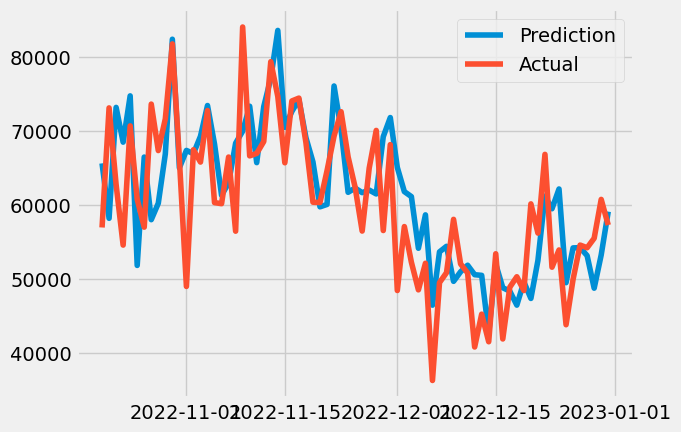

In [219]:
print(f"Model accuracy for - XGBOOST")
model_evaluation(model_xgb_fit, X_test, y_test)

## ADABOOST

Model accuracy for - ADABOOST
Mean Square Error: 63369884.201451406
______
Root Mean Square Error: 7960.52034740515
______
R_Score: 0.3893490050047336
______
Mean Absolute Percentage Error: 0.11383211835303668
              Prediction     SALES
2022-10-20  71350.339231  56957.54
2022-10-21  64575.647803  73081.05
2022-10-22  77386.509498  62742.98
2022-10-23  70542.610554  54584.54
2022-10-24  62943.715647  70657.09
2022-10-25  62745.368662  60767.55
2022-10-26  67313.703937  56998.69
2022-10-27  62084.199018  73595.04
2022-10-28  68779.138119  67328.23
2022-10-29  66374.308087  71601.51
2022-10-30  77386.509498  81710.93
2022-10-31  69753.122264  66179.11
2022-11-01  69271.354625  49009.52
2022-11-02  68171.846082  67437.37
2022-11-03  69809.918646  65777.49
2022-11-04  68779.138119  72732.49
2022-11-05  65761.120322  60311.93
2022-11-06  67313.703937  60167.25
2022-11-07  59518.136137  66457.81
2022-11-08  70542.610554  56459.57
2022-11-09  63490.412222  83986.35
2022-11-10  69753.12

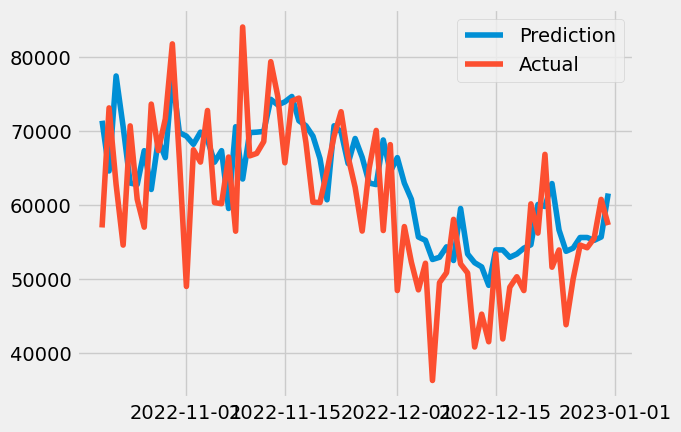

In [220]:
print(f"Model accuracy for - ADABOOST")
model_evaluation(model_ada_fit, X_test, y_test)

## SGD Regressor

Model accuracy for - SGD Regressor
Mean Square Error: 42084423.50704396
______
Root Mean Square Error: 6487.250843542583
______
R_Score: 0.5944620159525245
______
Mean Absolute Percentage Error: 0.08599124663023351
              Prediction     SALES
2022-10-20  64952.975556  56957.54
2022-10-21  56625.535528  73081.05
2022-10-22  67923.146498  62742.98
2022-10-23  71506.346081  54584.54
2022-10-24  69102.236113  70657.09
2022-10-25  56214.616461  60767.55
2022-10-26  63606.939088  56998.69
2022-10-27  61063.365720  73595.04
2022-10-28  62371.788471  67328.23
2022-10-29  62521.455226  71601.51
2022-10-30  72426.027758  81710.93
2022-10-31  65297.190819  66179.11
2022-11-01  58500.111869  49009.52
2022-11-02  67712.871126  67437.37
2022-11-03  70791.267034  65777.49
2022-11-04  70021.768063  72732.49
2022-11-05  64384.002830  60311.93
2022-11-06  62626.747138  60167.25
2022-11-07  64455.631506  66457.81
2022-11-08  71503.478783  56459.57
2022-11-09  69950.246036  83986.35
2022-11-10  673

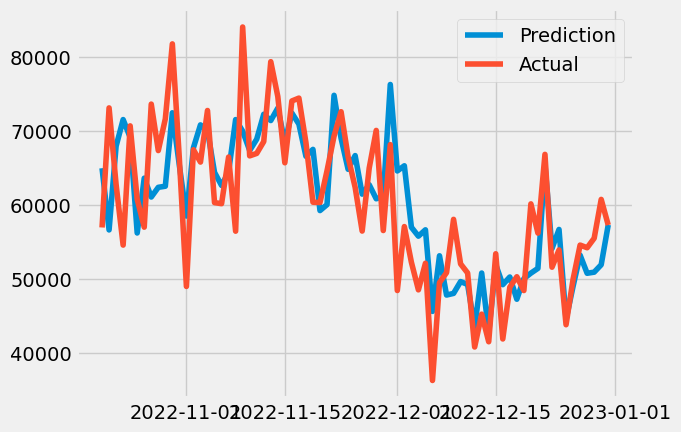

In [221]:
print(f"Model accuracy for - SGD Regressor")
model_evaluation(model_sgd_fit, X_test, y_test)

## LightGBM Regressor

Model accuracy for - LightGBM Regressor
Mean Square Error: 53932199.11655094
______
Root Mean Square Error: 7343.854513574662
______
R_Score: 0.480293337003599
______
Mean Absolute Percentage Error: 0.09889728698665652
              Prediction     SALES
2022-10-20  66290.090895  56957.54
2022-10-21  57630.703904  73081.05
2022-10-22  72889.065332  62742.98
2022-10-23  74224.247162  54584.54
2022-10-24  66784.745347  70657.09
2022-10-25  60460.326986  60767.55
2022-10-26  63181.754989  56998.69
2022-10-27  65130.466538  73595.04
2022-10-28  62329.363432  67328.23
2022-10-29  63893.549144  71601.51
2022-10-30  74845.353780  81710.93
2022-10-31  63101.097984  66179.11
2022-11-01  65260.640720  49009.52
2022-11-02  66311.079411  67437.37
2022-11-03  74014.374818  65777.49
2022-11-04  69744.732082  72732.49
2022-11-05  66415.374818  60311.93
2022-11-06  61925.175891  60167.25
2022-11-07  60589.308070  66457.81
2022-11-08  71080.185442  56459.57
2022-11-09  62854.408302  83986.35
2022-11-10 

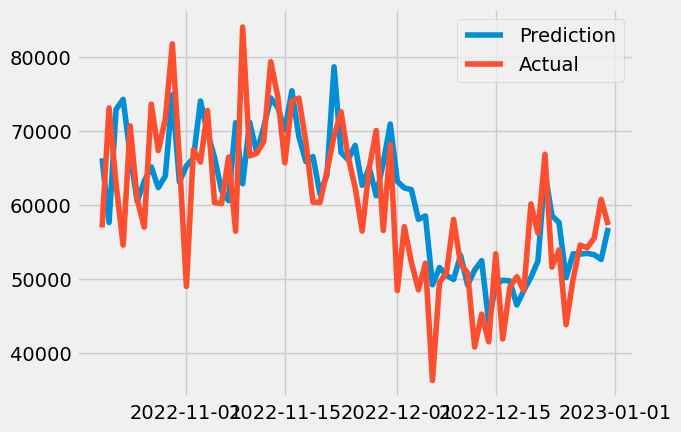

In [222]:
print(f"Model accuracy for - LightGBM Regressor")
model_evaluation(model_lgbm_fit, X_test, y_test)

## Hyperparameter Tuning


In [ ]:
# Function to perform hyperparameter tuning using GridSearchCV
def hyperparameter_tuning(model, X_train, y_train):
    """
    Perform hyperparameter tuning for a regression model using GridSearchCV.
    Args:
        model: Regression model to be tuned.
        X_train (array-like): Features for training.
        y_train (array-like): True target values for training.
    """
    
    # Initialize a Gradient Boosting Regressor model
    model = GradientBoostingRegressor()
    
    # Define the hyperparameter grid to search over
    param_grid = {
        'learning_rate': [0.01, 0.1, 1],
        'n_estimators': [1500, 2000, 2500],
        'max_depth': [10, 20, 30]
    }

    # Initialize GridSearchCV
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

    # Perform grid search on training data
    grid_search.fit(X_train, y_train)

    # Get the best parameters and the best estimator from grid search
    best_params = grid_search.best_params_
    best_estimator = grid_search.best_estimator_

    print("Best Parameters:", best_params)
    print(" - - - - - ")
    print("Best Parameters:", best_estimator)
    
hyperparameter_tuning(model_gb, X_train, y_train)

Best Hyperparameters: {'border_count': 32, 'depth': 4, 'iterations': 2000, 'l2_leaf_reg': 1, 'learning_rate': 0.01}
Best CatBoost Model MSE: 11.458290410776003

## Develop the model further to assess if forecasts can be developed for Customer or Product

In [104]:
# Select a subset of columns from the 'sales_df' DataFrame
cus_feature_columns = ['FEATURE_1', 'FEATURE_2', 'FEATURE_3', 'CUSTOMER_ID']
cus_new_sales_df = sales_df[cus_feature_columns]

# select the first 1453 counts to reshape the target variable
target_column = ['CUSTOMER_ID']
new_y_target = cus_new_sales_df.groupby(sales_df.index)[target_column].count().iloc[:1453]
new_y_target

,CUSTOMER_ID
2019-01-01,159
2019-01-02,122
2019-01-03,112
2019-01-04,125
2019-01-05,122
2019-01-06,132
2019-01-07,136
2019-01-08,124
2019-01-09,122
2019-01-10,130


In [100]:
new_y_target.shape

(1453, 1)

In [102]:
# Model Prediction
# Call the function to obtain trained models and data splits
model_rf_fit, model_gb_fit, model_svr_fit, model_knn_fit, model_xgb_fit, model_ada_fit, model_sgd_fit, model_lgbm_fit, X_test, y_test, X_train, y_train = model_pred_construct(X_features, new_y_target)


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

Model accuracy for - Gradient Boosting
Mean Square Error: 31.375849575917975
______
Root Mean Square Error: 5.601414961946488
______
R_Score: 0.7593192174076053
______
Mean Absolute Percentage Error: 0.03188993869378759
            Prediction  CUSTOMER_ID
2022-10-12  142.542908          145
2022-10-13  140.936837          142
2022-10-14  142.691344          140
2022-10-15  139.387779          139
2022-10-16  146.567639          152
2022-10-17  136.224477          136
2022-10-18  149.329383          167
2022-10-19  133.525910          138
2022-10-20  129.640601          125
2022-10-21  130.834354          121
2022-10-22  138.212718          135
2022-10-23  137.619734          133
2022-10-24  145.354321          139
2022-10-25  123.298737          125
2022-10-26  128.302437          126
2022-10-27  136.586651          124
2022-10-28  126.088631          133
2022-10-29  128.347221          133
2022-10-30  147.493733          144
2022-10-31  128.589154          126
2022-11-01  113.565339  

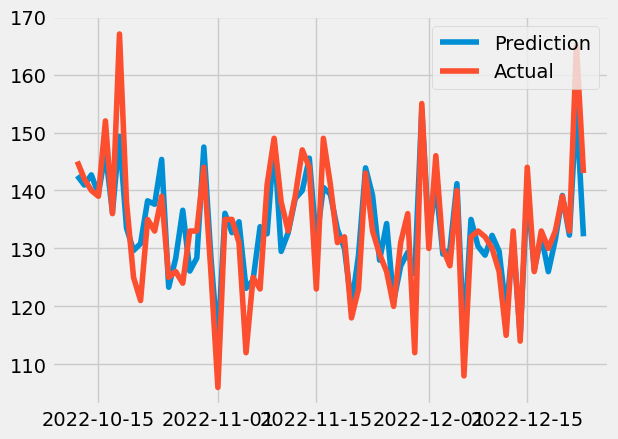

In [103]:
# For Customer
print(f"Model accuracy for - Gradient Boosting")
model_evaluation(model_gb_fit, X_test, y_test)

Model accuracy for aFRR Up - Random Forest
Mean Square Error: 35.800959414403586
______
Root Mean Square Error: 5.983390294340123
______
R_Score: 0.7253746736461043
______
Mean Absolute Percentage Error: 0.035703213415234414
            Prediction  CUSTOMER_ID
2022-10-12  143.621857          145
2022-10-13  139.331905          142
2022-10-14  142.363910          140
2022-10-15  137.318798          139
2022-10-16  146.755447          152
2022-10-17  134.038459          136
2022-10-18  147.163331          167
2022-10-19  131.432661          138
2022-10-20  131.637457          125
2022-10-21  130.593986          121
2022-10-22  139.051980          135
2022-10-23  137.783853          133
2022-10-24  145.329563          139
2022-10-25  123.651390          125
2022-10-26  127.210687          126
2022-10-27  137.342684          124
2022-10-28  128.406012          133
2022-10-29  127.912471          133
2022-10-30  146.495896          144
2022-10-31  130.363675          126
2022-11-01  117.822

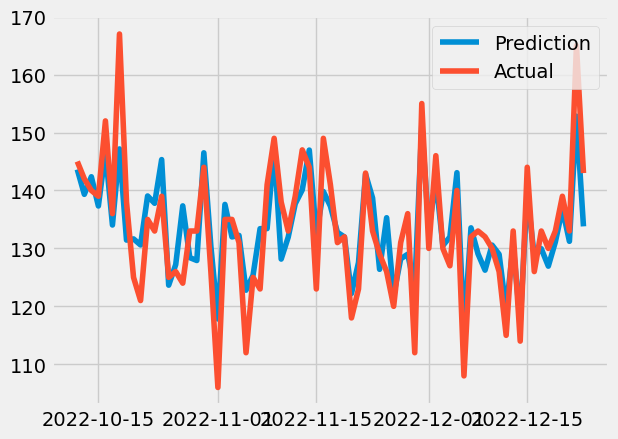

In [105]:
print(f"Model accuracy for aFRR Up - Random Forest")
model_evaluation(model_rf_fit, X_test, y_test)